# Neural Computation - 2021

# Tutorial - AutoEncoders in Pytorch

**Aims of this tutorial**:
- Implement and train basic Auto-Encoders in Pytorch.
- Investigate how the learned latent space looks.
- Investigate whether we can synthesize new data with basic Auto-Encoders.
- See how we can use Auto-Encoders trained with Unsupervised Learning to improve training of Supervised Classifiers when labelled data are limited.

It may look long, but it should be easy to complete. Understanding the core points of this tutorial are of **high importance and is part of the assessable material for the course**. Invest some time to study and understand it, and don't hesitate to ask if you don't understand something.

**Prerequisites**:
- Familiar with python, numpy, and basic PyTorch.
- Familiar with MNIST, Multi-Layer-Perceptrons (MLPs), and how to train MLPs (forward/backward pass) in PyTorch.


**Notes**:
- Docs for Pytorch's functions you will need:  
https://pytorch.org/docs/stable/tensors.html  
https://pytorch.org/docs/stable/nn.html  
- Some helper functions for loading and plotting data are given in `./utils` folder. They will be used out of the box below.

** **THE CODE BELOW WILL NOT RUN BY DEFAULT.** ** \
This is because it includes **blanks** (noted with **???**) that you need to fill appropriately where requested.

## Preliminary: Loading and refreshing MNIST

We will be using MNIST data in this tutorial. Because the images are small, the database allows small networks to be quickly trained using CPU. Anything larger afterwards will require GPUs.

Important point to understand is the structure of the loaded data. Especially the **shape** of the loaded numpy arrays, because we need to manipulate it carefully, when processing it with neural networks.

Lets load and inspect the data...

In [1]:
# -*- coding: utf-8 -*-
# The below is for auto-reloading external modules after they are changed, such as those in ./utils.
# Issue: http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

import numpy as np
from utils.data_utils import get_mnist # Helper function. Use it out of the box.

# Constants
DATA_DIR = './data/mnist' # Location we will keep the data.
SEED = 111111

# If datasets are not at specified location, they will be downloaded.
train_imgs, train_lbls = get_mnist(data_dir=DATA_DIR, train=True, download=True)
test_imgs, test_lbls = get_mnist(data_dir=DATA_DIR, train=False, download=True)

print("[train_imgs] Type: ", type(train_imgs), "|| Shape:", train_imgs.shape, "|| Data type: ", train_imgs.dtype )
print("[train_lbls] Type: ", type(train_lbls), "|| Shape:", train_lbls.shape, "|| Data type: ", train_lbls.dtype )
print('Class labels in train = ', np.unique(train_lbls))

print("[test_imgs] Type: ", type(test_imgs), "|| Shape:", test_imgs.shape, " || Data type: ", test_imgs.dtype )
print("[test_lbls] Type: ", type(test_lbls), "|| Shape:", test_lbls.shape, " || Data type: ", test_lbls.dtype )
print('Class labels in test = ', np.unique(test_lbls))

N_tr_imgs = train_imgs.shape[0] # N hereafter. Number of training images in database.
H_height = train_imgs.shape[1] # H hereafter
W_width = train_imgs.shape[2] # W hereafter
C_classes = len(np.unique(train_lbls)) # C hereafter

[train_imgs] Type:  <class 'numpy.ndarray'> || Shape: (60000, 28, 28) || Data type:  uint8
[train_lbls] Type:  <class 'numpy.ndarray'> || Shape: (60000,) || Data type:  int16
Class labels in train =  [0 1 2 3 4 5 6 7 8 9]
[test_imgs] Type:  <class 'numpy.ndarray'> || Shape: (10000, 28, 28)  || Data type:  uint8
[test_lbls] Type:  <class 'numpy.ndarray'> || Shape: (10000,)  || Data type:  int16
Class labels in test =  [0 1 2 3 4 5 6 7 8 9]


Above we see that data have been loaded in *numpy arrays*.    
Arrays with images have **shape ( N = number of images, H = height, W = width )**.  
Arrays with labels have **shape ( N = number of images)**, holding one integer per image, the digit's class.

MNIST comprises of a **train set (N_tr = 60000) images** and a **test set (N_te = 10000) images**.  
We will use the train set for unsupervised learning. The test set will only be used for evaluating generalisation of classifiers towards the end of the tutorial.

Lets plot a few image in one collage to have a look...

n_rows= 10


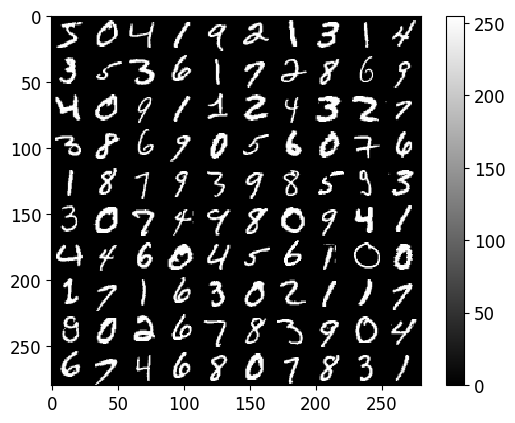

In [2]:
%matplotlib inline
from utils.plotting import plot_grid_of_images # Helper functions, use out of the box.
plot_grid_of_images(train_imgs[0:100], n_imgs_per_row=10)

Notice that the intensities in the images take **values from 0 to 255**.

## Preliminary: Data pre-processing

A first step in almost all pipelines is to pre-process the data, to make them more appropriate for a model.

Below, we will perform 3 points:  
a) Change the labels from an integer representation to a **one-hot representation** of the **C=10 classes**.\
b) Re-scale the **intensities** in the images, from the range \[0,255\], to be instead in the range \[-1,+1\].\
c) **Vectorise the 2D images into 1D vectors for the MLP**, which only gets vectors as input.

In [3]:
# a) Change representation of labels to one-hot vectors of length C=10.
train_lbls_onehot = np.zeros(shape=(train_lbls.shape[0], C_classes ) )
train_lbls_onehot[ np.arange(train_lbls_onehot.shape[0]), train_lbls ] = 1
test_lbls_onehot = np.zeros(shape=(test_lbls.shape[0], C_classes ) )
test_lbls_onehot[ np.arange(test_lbls_onehot.shape[0]), test_lbls ] = 1
print("BEFORE: [train_lbls]        Type: ", type(train_lbls), "|| Shape:", train_lbls.shape, " || Data type: ", train_lbls.dtype )
print("AFTER : [train_lbls_onehot] Type: ", type(train_lbls_onehot), "|| Shape:", train_lbls_onehot.shape, " || Data type: ", train_lbls_onehot.dtype )

BEFORE: [train_lbls]        Type:  <class 'numpy.ndarray'> || Shape: (60000,)  || Data type:  int16
AFTER : [train_lbls_onehot] Type:  <class 'numpy.ndarray'> || Shape: (60000, 10)  || Data type:  float64


Plotting image of index: [ 0 ]
Class label for this image is:  5
One-hot label representation: [ [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.] ]


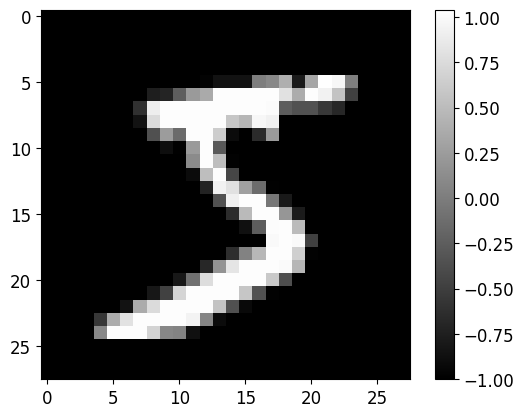

In [4]:
# b) Re-scale image intensities, from [0,255] to [-1, +1].
# This commonly facilitates learning:
# A zero-centered signal with small magnitude allows avoiding exploding/vanishing problems easier.
from utils.data_utils import normalize_int_whole_database # Helper function. Use out of the box.
train_imgs = normalize_int_whole_database(train_imgs, norm_type="minus_1_to_1")
test_imgs = normalize_int_whole_database(test_imgs, norm_type="minus_1_to_1")

# Lets plot one image.
from utils.plotting import plot_image # Helper function, use out of the box.
index = 0  # Try any, up to 60000
print("Plotting image of index: [", index, "]")
print("Class label for this image is: ", train_lbls[index])
print("One-hot label representation: [", train_lbls_onehot[index], "]")
plot_image(train_imgs[index])
# Notice the magnitude of intensities. Black is now negative and white is positive float.
# Compare with intensities of figure further above.

In [5]:
# c) Flatten the images, from 2D matrices to 1D vectors. MLPs take feature-vectors as input, not 2D images.
train_imgs_flat = train_imgs.reshape([train_imgs.shape[0], -1]) # Preserve 1st dim (S = num Samples), flatten others.
test_imgs_flat = test_imgs.reshape([test_imgs.shape[0], -1])
print("Shape of numpy array holding the training database:")
print("Original : [N, H, W] = [", train_imgs.shape , "]")
print("Flattened: [N, H*W]  = [", train_imgs_flat.shape , "]")

Shape of numpy array holding the training database:
Original : [N, H, W] = [ (60000, 28, 28) ]
Flattened: [N, H*W]  = [ (60000, 784) ]


## Task 1: Unsupervised training with SGD for Auto-Encoders

Below you are given the main training function, which performs gradient descent in unsupervised fashion. This will be called by all following parts of the tutorial.

The function takes a model and data, and performs an iteration of stochastic gradient descent.

In the below, change the code to make gradient descent stochastic, by sampling a **random** batch per iteration instead of constantly the same training samples. (just a warmup, for you to read the training function :-))

In [6]:
train_imgs.shape[0]

60000

In [7]:
from utils.plotting import plot_train_progress_1, plot_grids_of_images  # Use out of the box


def get_random_batch(train_imgs, train_lbls, batch_size, rng):
    # train_imgs: Images. Numpy array of shape [N, H * W]
    # train_lbls: Labels of images. None, or Numpy array of shape [N, C_classes], one hot label for each image.
    # batch_size: integer. Size that the batch should have.
    
    ####### TODO: Sample a random batch of images for training. Fill in the blanks (???) ######### 
    indices = rng.randint(low=0, high=train_imgs.shape[0], size=batch_size, dtype='int32')
    ##############################################################################################
    
    train_imgs_batch = train_imgs[indices]
    if train_lbls is not None:  # Enables function to be used both for supervised and unsupervised learning
        train_lbls_batch = train_lbls[indices]
    else:
        train_lbls_batch = None
    return [train_imgs_batch, train_lbls_batch]


def unsupervised_training_AE(net,
                             loss_func,
                             rng,
                             train_imgs_all,
                             batch_size,
                             learning_rate,
                             total_iters,
                             iters_per_recon_plot=-1):
    # net: Instance of a model. See classes: Autoencoder, MLPClassifier, etc further below
    # loss_func: Function that computes the loss. See functions: reconstruction_loss or cross_entropy.
    # rng: numpy random number generator
    # train_imgs_all: All the training images. Numpy array, shape [N_tr, H * W]
    # batch_size: Size of the batch that should be processed per SGD iteration by a model.
    # learning_rate: self explanatory.
    # total_iters: how many SGD iterations to perform.
    # iters_per_recon_plot: Integer. Every that many iterations the model predicts training images ...
    #                      ...and we plot their reconstruction. For visual observation of the results.
    loss_values_to_plot = []
    
    optimizer = optim.Adam(net.params, lr=learning_rate)  # Will use PyTorch's Adam optimizer out of the box
        
    for t in range(total_iters):
        # Sample batch for this SGD iteration
        x_imgs, _ = get_random_batch(train_imgs_all, None, batch_size, rng)
        
        # Forward pass
        x_pred, z_codes = net.forward_pass(x_imgs)

        # Compute loss:
        loss = loss_func(x_pred, x_imgs)
        
        # Pytorch way
        optimizer.zero_grad()
        _ = net.backward_pass(loss)
        optimizer.step()
        
        # ==== Report training loss and accuracy ======
        loss_np = loss if type(loss) is type(float) else loss.item()  # Pytorch returns tensor. Cast to float
        print("[iter:", t, "]: Training Loss: {0:.2f}".format(loss))
        loss_values_to_plot.append(loss_np)
        
        # =============== Every few iterations, show reconstructions ================#
        if t==total_iters-1 or t%iters_per_recon_plot == 0:
            # Reconstruct all images, to plot reconstructions.
            x_pred_all, z_codes_all = net.forward_pass(train_imgs_all)
            # Cast tensors to numpy arrays
            x_pred_all_np = x_pred_all if type(x_pred_all) is np.ndarray else x_pred_all.detach().numpy()
            
            # Predicted reconstructions have vector shape. Reshape them to original image shape.
            train_imgs_resh = train_imgs_all.reshape([train_imgs_all.shape[0], H_height, W_width])
            x_pred_all_np_resh = x_pred_all_np.reshape([train_imgs_all.shape[0], H_height, W_width])
            
            # Plot a few images, originals and predicted reconstructions.
            plot_grids_of_images([train_imgs_resh[0:100], x_pred_all_np_resh[0:100]],
                                  titles=["Real", "Reconstructions"],
                                  n_imgs_per_row=10,
                                  dynamically=True)
            
    # In the end of the process, plot loss.
    plot_train_progress_1(loss_values_to_plot, iters_per_point=1)
    

Running the above should give no output yet. But we will use this in task 2, so hopefully you completed Task 1 right :)

## Task 2: Auto-Encoder

In this task, you are called to create the architecture of an Auto-Encoder.
Make necessary modifications where requested, to create the below architecture:

![title](./documentation/ae_bottleneck_2.png)


[iter: 0 ]: Training Loss: 0.94


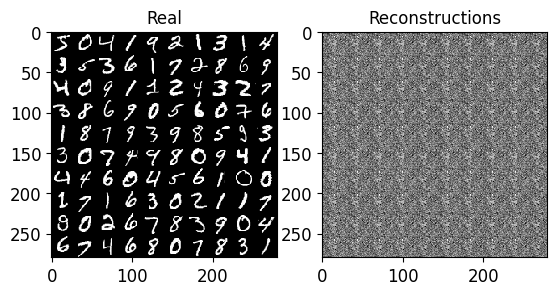

[iter: 1 ]: Training Loss: 0.92
[iter: 2 ]: Training Loss: 0.88
[iter: 3 ]: Training Loss: 0.78
[iter: 4 ]: Training Loss: 0.60
[iter: 5 ]: Training Loss: 0.42
[iter: 6 ]: Training Loss: 0.30
[iter: 7 ]: Training Loss: 0.33
[iter: 8 ]: Training Loss: 0.31
[iter: 9 ]: Training Loss: 0.32
[iter: 10 ]: Training Loss: 0.32
[iter: 11 ]: Training Loss: 0.28
[iter: 12 ]: Training Loss: 0.32
[iter: 13 ]: Training Loss: 0.32
[iter: 14 ]: Training Loss: 0.32
[iter: 15 ]: Training Loss: 0.31
[iter: 16 ]: Training Loss: 0.32
[iter: 17 ]: Training Loss: 0.34
[iter: 18 ]: Training Loss: 0.33
[iter: 19 ]: Training Loss: 0.32
[iter: 20 ]: Training Loss: 0.29
[iter: 21 ]: Training Loss: 0.30
[iter: 22 ]: Training Loss: 0.31
[iter: 23 ]: Training Loss: 0.33
[iter: 24 ]: Training Loss: 0.32
[iter: 25 ]: Training Loss: 0.29
[iter: 26 ]: Training Loss: 0.28
[iter: 27 ]: Training Loss: 0.29
[iter: 28 ]: Training Loss: 0.30
[iter: 29 ]: Training Loss: 0.31
[iter: 30 ]: Training Loss: 0.30
[iter: 31 ]: Traini

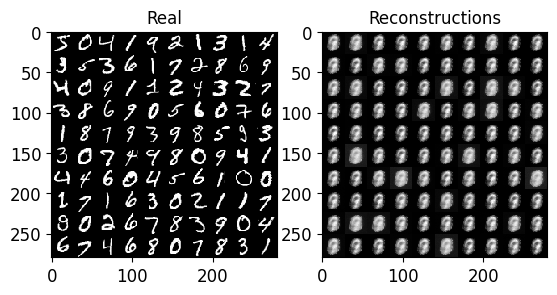

[iter: 51 ]: Training Loss: 0.28
[iter: 52 ]: Training Loss: 0.27
[iter: 53 ]: Training Loss: 0.25
[iter: 54 ]: Training Loss: 0.26
[iter: 55 ]: Training Loss: 0.27
[iter: 56 ]: Training Loss: 0.27
[iter: 57 ]: Training Loss: 0.27
[iter: 58 ]: Training Loss: 0.27
[iter: 59 ]: Training Loss: 0.28
[iter: 60 ]: Training Loss: 0.26
[iter: 61 ]: Training Loss: 0.29
[iter: 62 ]: Training Loss: 0.30
[iter: 63 ]: Training Loss: 0.28
[iter: 64 ]: Training Loss: 0.26
[iter: 65 ]: Training Loss: 0.28
[iter: 66 ]: Training Loss: 0.26
[iter: 67 ]: Training Loss: 0.27
[iter: 68 ]: Training Loss: 0.27
[iter: 69 ]: Training Loss: 0.27
[iter: 70 ]: Training Loss: 0.28
[iter: 71 ]: Training Loss: 0.28
[iter: 72 ]: Training Loss: 0.26
[iter: 73 ]: Training Loss: 0.27
[iter: 74 ]: Training Loss: 0.24
[iter: 75 ]: Training Loss: 0.27
[iter: 76 ]: Training Loss: 0.26
[iter: 77 ]: Training Loss: 0.27
[iter: 78 ]: Training Loss: 0.27
[iter: 79 ]: Training Loss: 0.28
[iter: 80 ]: Training Loss: 0.26
[iter: 81 

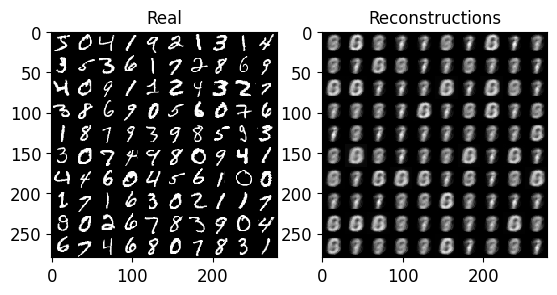

[iter: 101 ]: Training Loss: 0.26
[iter: 102 ]: Training Loss: 0.25
[iter: 103 ]: Training Loss: 0.25
[iter: 104 ]: Training Loss: 0.25
[iter: 105 ]: Training Loss: 0.25
[iter: 106 ]: Training Loss: 0.26
[iter: 107 ]: Training Loss: 0.25
[iter: 108 ]: Training Loss: 0.27
[iter: 109 ]: Training Loss: 0.25
[iter: 110 ]: Training Loss: 0.26
[iter: 111 ]: Training Loss: 0.27
[iter: 112 ]: Training Loss: 0.24
[iter: 113 ]: Training Loss: 0.23
[iter: 114 ]: Training Loss: 0.24
[iter: 115 ]: Training Loss: 0.25
[iter: 116 ]: Training Loss: 0.26
[iter: 117 ]: Training Loss: 0.28
[iter: 118 ]: Training Loss: 0.27
[iter: 119 ]: Training Loss: 0.25
[iter: 120 ]: Training Loss: 0.24
[iter: 121 ]: Training Loss: 0.27
[iter: 122 ]: Training Loss: 0.25
[iter: 123 ]: Training Loss: 0.24
[iter: 124 ]: Training Loss: 0.28
[iter: 125 ]: Training Loss: 0.24
[iter: 126 ]: Training Loss: 0.25
[iter: 127 ]: Training Loss: 0.24
[iter: 128 ]: Training Loss: 0.26
[iter: 129 ]: Training Loss: 0.26
[iter: 130 ]: 

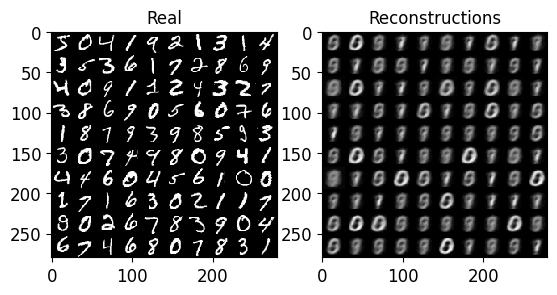

[iter: 151 ]: Training Loss: 0.23
[iter: 152 ]: Training Loss: 0.26
[iter: 153 ]: Training Loss: 0.24
[iter: 154 ]: Training Loss: 0.27
[iter: 155 ]: Training Loss: 0.27
[iter: 156 ]: Training Loss: 0.25
[iter: 157 ]: Training Loss: 0.26
[iter: 158 ]: Training Loss: 0.23
[iter: 159 ]: Training Loss: 0.26
[iter: 160 ]: Training Loss: 0.26
[iter: 161 ]: Training Loss: 0.23
[iter: 162 ]: Training Loss: 0.26
[iter: 163 ]: Training Loss: 0.25
[iter: 164 ]: Training Loss: 0.25
[iter: 165 ]: Training Loss: 0.24
[iter: 166 ]: Training Loss: 0.25
[iter: 167 ]: Training Loss: 0.24
[iter: 168 ]: Training Loss: 0.25
[iter: 169 ]: Training Loss: 0.21
[iter: 170 ]: Training Loss: 0.27
[iter: 171 ]: Training Loss: 0.23
[iter: 172 ]: Training Loss: 0.25
[iter: 173 ]: Training Loss: 0.26
[iter: 174 ]: Training Loss: 0.25
[iter: 175 ]: Training Loss: 0.25
[iter: 176 ]: Training Loss: 0.26
[iter: 177 ]: Training Loss: 0.26
[iter: 178 ]: Training Loss: 0.23
[iter: 179 ]: Training Loss: 0.23
[iter: 180 ]: 

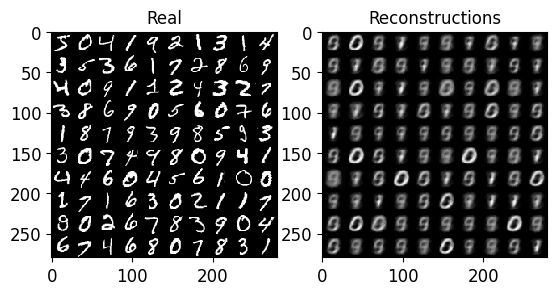

[iter: 201 ]: Training Loss: 0.21
[iter: 202 ]: Training Loss: 0.23
[iter: 203 ]: Training Loss: 0.22
[iter: 204 ]: Training Loss: 0.24
[iter: 205 ]: Training Loss: 0.22
[iter: 206 ]: Training Loss: 0.24
[iter: 207 ]: Training Loss: 0.24
[iter: 208 ]: Training Loss: 0.21
[iter: 209 ]: Training Loss: 0.26
[iter: 210 ]: Training Loss: 0.23
[iter: 211 ]: Training Loss: 0.23
[iter: 212 ]: Training Loss: 0.24
[iter: 213 ]: Training Loss: 0.25
[iter: 214 ]: Training Loss: 0.24
[iter: 215 ]: Training Loss: 0.23
[iter: 216 ]: Training Loss: 0.24
[iter: 217 ]: Training Loss: 0.24
[iter: 218 ]: Training Loss: 0.25
[iter: 219 ]: Training Loss: 0.25
[iter: 220 ]: Training Loss: 0.25
[iter: 221 ]: Training Loss: 0.23
[iter: 222 ]: Training Loss: 0.23
[iter: 223 ]: Training Loss: 0.23
[iter: 224 ]: Training Loss: 0.24
[iter: 225 ]: Training Loss: 0.23
[iter: 226 ]: Training Loss: 0.27
[iter: 227 ]: Training Loss: 0.25
[iter: 228 ]: Training Loss: 0.24
[iter: 229 ]: Training Loss: 0.26
[iter: 230 ]: 

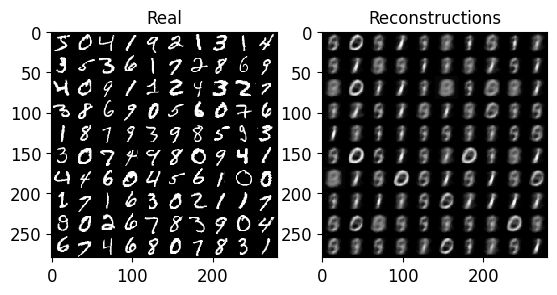

[iter: 251 ]: Training Loss: 0.23
[iter: 252 ]: Training Loss: 0.25
[iter: 253 ]: Training Loss: 0.25
[iter: 254 ]: Training Loss: 0.24
[iter: 255 ]: Training Loss: 0.24
[iter: 256 ]: Training Loss: 0.23
[iter: 257 ]: Training Loss: 0.25
[iter: 258 ]: Training Loss: 0.23
[iter: 259 ]: Training Loss: 0.25
[iter: 260 ]: Training Loss: 0.25
[iter: 261 ]: Training Loss: 0.24
[iter: 262 ]: Training Loss: 0.23
[iter: 263 ]: Training Loss: 0.22
[iter: 264 ]: Training Loss: 0.24
[iter: 265 ]: Training Loss: 0.24
[iter: 266 ]: Training Loss: 0.23
[iter: 267 ]: Training Loss: 0.25
[iter: 268 ]: Training Loss: 0.21
[iter: 269 ]: Training Loss: 0.24
[iter: 270 ]: Training Loss: 0.24
[iter: 271 ]: Training Loss: 0.25
[iter: 272 ]: Training Loss: 0.22
[iter: 273 ]: Training Loss: 0.22
[iter: 274 ]: Training Loss: 0.23
[iter: 275 ]: Training Loss: 0.24
[iter: 276 ]: Training Loss: 0.21
[iter: 277 ]: Training Loss: 0.24
[iter: 278 ]: Training Loss: 0.23
[iter: 279 ]: Training Loss: 0.25
[iter: 280 ]: 

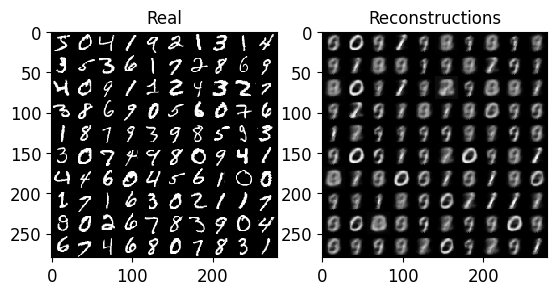

[iter: 301 ]: Training Loss: 0.22
[iter: 302 ]: Training Loss: 0.23
[iter: 303 ]: Training Loss: 0.24
[iter: 304 ]: Training Loss: 0.22
[iter: 305 ]: Training Loss: 0.25
[iter: 306 ]: Training Loss: 0.24
[iter: 307 ]: Training Loss: 0.22
[iter: 308 ]: Training Loss: 0.22
[iter: 309 ]: Training Loss: 0.24
[iter: 310 ]: Training Loss: 0.24
[iter: 311 ]: Training Loss: 0.21
[iter: 312 ]: Training Loss: 0.22
[iter: 313 ]: Training Loss: 0.20
[iter: 314 ]: Training Loss: 0.23
[iter: 315 ]: Training Loss: 0.22
[iter: 316 ]: Training Loss: 0.25
[iter: 317 ]: Training Loss: 0.22
[iter: 318 ]: Training Loss: 0.25
[iter: 319 ]: Training Loss: 0.24
[iter: 320 ]: Training Loss: 0.23
[iter: 321 ]: Training Loss: 0.23
[iter: 322 ]: Training Loss: 0.23
[iter: 323 ]: Training Loss: 0.22
[iter: 324 ]: Training Loss: 0.22
[iter: 325 ]: Training Loss: 0.22
[iter: 326 ]: Training Loss: 0.24
[iter: 327 ]: Training Loss: 0.24
[iter: 328 ]: Training Loss: 0.25
[iter: 329 ]: Training Loss: 0.23
[iter: 330 ]: 

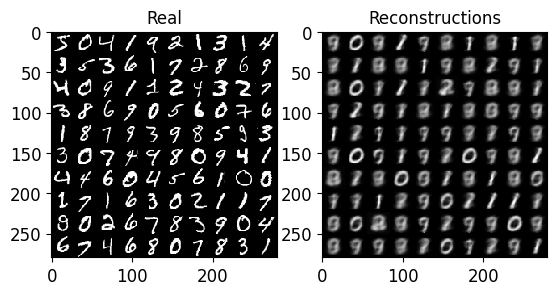

[iter: 351 ]: Training Loss: 0.23
[iter: 352 ]: Training Loss: 0.25
[iter: 353 ]: Training Loss: 0.24
[iter: 354 ]: Training Loss: 0.24
[iter: 355 ]: Training Loss: 0.22
[iter: 356 ]: Training Loss: 0.24
[iter: 357 ]: Training Loss: 0.25
[iter: 358 ]: Training Loss: 0.23
[iter: 359 ]: Training Loss: 0.22
[iter: 360 ]: Training Loss: 0.22
[iter: 361 ]: Training Loss: 0.24
[iter: 362 ]: Training Loss: 0.23
[iter: 363 ]: Training Loss: 0.22
[iter: 364 ]: Training Loss: 0.21
[iter: 365 ]: Training Loss: 0.22
[iter: 366 ]: Training Loss: 0.23
[iter: 367 ]: Training Loss: 0.23
[iter: 368 ]: Training Loss: 0.22
[iter: 369 ]: Training Loss: 0.20
[iter: 370 ]: Training Loss: 0.21
[iter: 371 ]: Training Loss: 0.25
[iter: 372 ]: Training Loss: 0.24
[iter: 373 ]: Training Loss: 0.21
[iter: 374 ]: Training Loss: 0.23
[iter: 375 ]: Training Loss: 0.23
[iter: 376 ]: Training Loss: 0.21
[iter: 377 ]: Training Loss: 0.22
[iter: 378 ]: Training Loss: 0.21
[iter: 379 ]: Training Loss: 0.22
[iter: 380 ]: 

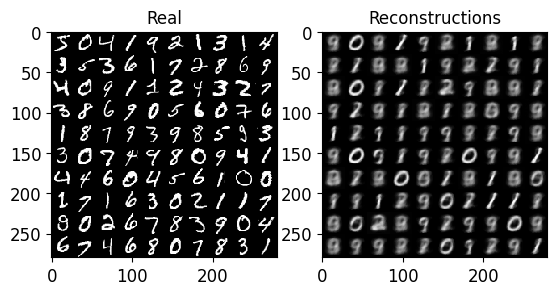

[iter: 401 ]: Training Loss: 0.22
[iter: 402 ]: Training Loss: 0.20
[iter: 403 ]: Training Loss: 0.24
[iter: 404 ]: Training Loss: 0.24
[iter: 405 ]: Training Loss: 0.23
[iter: 406 ]: Training Loss: 0.22
[iter: 407 ]: Training Loss: 0.21
[iter: 408 ]: Training Loss: 0.22
[iter: 409 ]: Training Loss: 0.23
[iter: 410 ]: Training Loss: 0.22
[iter: 411 ]: Training Loss: 0.21
[iter: 412 ]: Training Loss: 0.23
[iter: 413 ]: Training Loss: 0.20
[iter: 414 ]: Training Loss: 0.22
[iter: 415 ]: Training Loss: 0.22
[iter: 416 ]: Training Loss: 0.22
[iter: 417 ]: Training Loss: 0.22
[iter: 418 ]: Training Loss: 0.24
[iter: 419 ]: Training Loss: 0.23
[iter: 420 ]: Training Loss: 0.23
[iter: 421 ]: Training Loss: 0.23
[iter: 422 ]: Training Loss: 0.23
[iter: 423 ]: Training Loss: 0.23
[iter: 424 ]: Training Loss: 0.25
[iter: 425 ]: Training Loss: 0.22
[iter: 426 ]: Training Loss: 0.21
[iter: 427 ]: Training Loss: 0.23
[iter: 428 ]: Training Loss: 0.23
[iter: 429 ]: Training Loss: 0.22
[iter: 430 ]: 

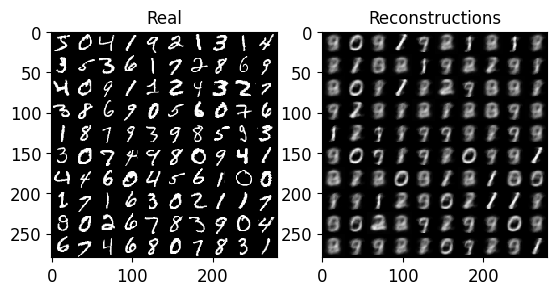

[iter: 451 ]: Training Loss: 0.20
[iter: 452 ]: Training Loss: 0.21
[iter: 453 ]: Training Loss: 0.24
[iter: 454 ]: Training Loss: 0.22
[iter: 455 ]: Training Loss: 0.24
[iter: 456 ]: Training Loss: 0.21
[iter: 457 ]: Training Loss: 0.23
[iter: 458 ]: Training Loss: 0.21
[iter: 459 ]: Training Loss: 0.23
[iter: 460 ]: Training Loss: 0.21
[iter: 461 ]: Training Loss: 0.24
[iter: 462 ]: Training Loss: 0.23
[iter: 463 ]: Training Loss: 0.21
[iter: 464 ]: Training Loss: 0.22
[iter: 465 ]: Training Loss: 0.22
[iter: 466 ]: Training Loss: 0.23
[iter: 467 ]: Training Loss: 0.23
[iter: 468 ]: Training Loss: 0.23
[iter: 469 ]: Training Loss: 0.24
[iter: 470 ]: Training Loss: 0.23
[iter: 471 ]: Training Loss: 0.23
[iter: 472 ]: Training Loss: 0.23
[iter: 473 ]: Training Loss: 0.22
[iter: 474 ]: Training Loss: 0.22
[iter: 475 ]: Training Loss: 0.21
[iter: 476 ]: Training Loss: 0.22
[iter: 477 ]: Training Loss: 0.23
[iter: 478 ]: Training Loss: 0.22
[iter: 479 ]: Training Loss: 0.20
[iter: 480 ]: 

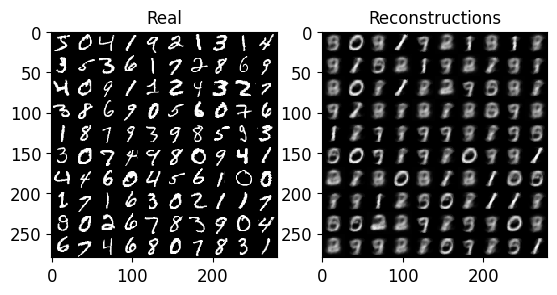

[iter: 501 ]: Training Loss: 0.23
[iter: 502 ]: Training Loss: 0.21
[iter: 503 ]: Training Loss: 0.22
[iter: 504 ]: Training Loss: 0.21
[iter: 505 ]: Training Loss: 0.22
[iter: 506 ]: Training Loss: 0.22
[iter: 507 ]: Training Loss: 0.22
[iter: 508 ]: Training Loss: 0.21
[iter: 509 ]: Training Loss: 0.24
[iter: 510 ]: Training Loss: 0.21
[iter: 511 ]: Training Loss: 0.20
[iter: 512 ]: Training Loss: 0.20
[iter: 513 ]: Training Loss: 0.22
[iter: 514 ]: Training Loss: 0.21
[iter: 515 ]: Training Loss: 0.21
[iter: 516 ]: Training Loss: 0.22
[iter: 517 ]: Training Loss: 0.23
[iter: 518 ]: Training Loss: 0.23
[iter: 519 ]: Training Loss: 0.23
[iter: 520 ]: Training Loss: 0.23
[iter: 521 ]: Training Loss: 0.21
[iter: 522 ]: Training Loss: 0.21
[iter: 523 ]: Training Loss: 0.21
[iter: 524 ]: Training Loss: 0.20
[iter: 525 ]: Training Loss: 0.21
[iter: 526 ]: Training Loss: 0.22
[iter: 527 ]: Training Loss: 0.20
[iter: 528 ]: Training Loss: 0.23
[iter: 529 ]: Training Loss: 0.22
[iter: 530 ]: 

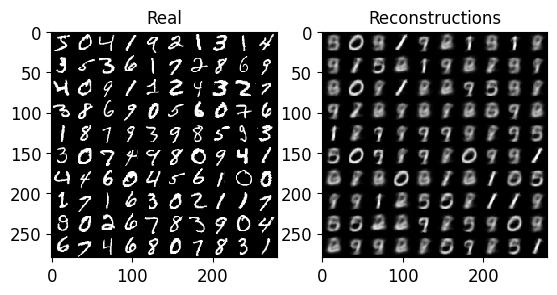

[iter: 551 ]: Training Loss: 0.21
[iter: 552 ]: Training Loss: 0.23
[iter: 553 ]: Training Loss: 0.22
[iter: 554 ]: Training Loss: 0.21
[iter: 555 ]: Training Loss: 0.22
[iter: 556 ]: Training Loss: 0.21
[iter: 557 ]: Training Loss: 0.19
[iter: 558 ]: Training Loss: 0.20
[iter: 559 ]: Training Loss: 0.24
[iter: 560 ]: Training Loss: 0.22
[iter: 561 ]: Training Loss: 0.21
[iter: 562 ]: Training Loss: 0.23
[iter: 563 ]: Training Loss: 0.20
[iter: 564 ]: Training Loss: 0.21
[iter: 565 ]: Training Loss: 0.22
[iter: 566 ]: Training Loss: 0.21
[iter: 567 ]: Training Loss: 0.23
[iter: 568 ]: Training Loss: 0.25
[iter: 569 ]: Training Loss: 0.24
[iter: 570 ]: Training Loss: 0.21
[iter: 571 ]: Training Loss: 0.23
[iter: 572 ]: Training Loss: 0.22
[iter: 573 ]: Training Loss: 0.22
[iter: 574 ]: Training Loss: 0.20
[iter: 575 ]: Training Loss: 0.22
[iter: 576 ]: Training Loss: 0.23
[iter: 577 ]: Training Loss: 0.21
[iter: 578 ]: Training Loss: 0.22
[iter: 579 ]: Training Loss: 0.20
[iter: 580 ]: 

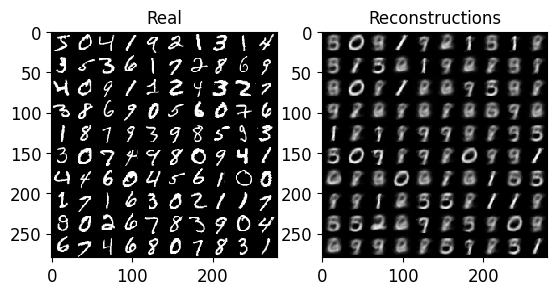

[iter: 601 ]: Training Loss: 0.20
[iter: 602 ]: Training Loss: 0.21
[iter: 603 ]: Training Loss: 0.21
[iter: 604 ]: Training Loss: 0.22
[iter: 605 ]: Training Loss: 0.21
[iter: 606 ]: Training Loss: 0.23
[iter: 607 ]: Training Loss: 0.21
[iter: 608 ]: Training Loss: 0.21
[iter: 609 ]: Training Loss: 0.19
[iter: 610 ]: Training Loss: 0.22
[iter: 611 ]: Training Loss: 0.21
[iter: 612 ]: Training Loss: 0.22
[iter: 613 ]: Training Loss: 0.21
[iter: 614 ]: Training Loss: 0.20
[iter: 615 ]: Training Loss: 0.20
[iter: 616 ]: Training Loss: 0.20
[iter: 617 ]: Training Loss: 0.23
[iter: 618 ]: Training Loss: 0.19
[iter: 619 ]: Training Loss: 0.22
[iter: 620 ]: Training Loss: 0.20
[iter: 621 ]: Training Loss: 0.20
[iter: 622 ]: Training Loss: 0.23
[iter: 623 ]: Training Loss: 0.22
[iter: 624 ]: Training Loss: 0.20
[iter: 625 ]: Training Loss: 0.21
[iter: 626 ]: Training Loss: 0.23
[iter: 627 ]: Training Loss: 0.18
[iter: 628 ]: Training Loss: 0.21
[iter: 629 ]: Training Loss: 0.22
[iter: 630 ]: 

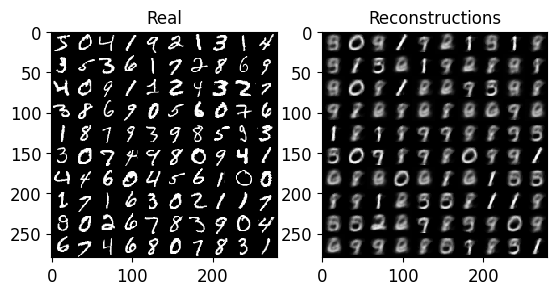

[iter: 651 ]: Training Loss: 0.23
[iter: 652 ]: Training Loss: 0.20
[iter: 653 ]: Training Loss: 0.23
[iter: 654 ]: Training Loss: 0.20
[iter: 655 ]: Training Loss: 0.23
[iter: 656 ]: Training Loss: 0.18
[iter: 657 ]: Training Loss: 0.22
[iter: 658 ]: Training Loss: 0.21
[iter: 659 ]: Training Loss: 0.21
[iter: 660 ]: Training Loss: 0.20
[iter: 661 ]: Training Loss: 0.20
[iter: 662 ]: Training Loss: 0.22
[iter: 663 ]: Training Loss: 0.20
[iter: 664 ]: Training Loss: 0.20
[iter: 665 ]: Training Loss: 0.21
[iter: 666 ]: Training Loss: 0.22
[iter: 667 ]: Training Loss: 0.21
[iter: 668 ]: Training Loss: 0.22
[iter: 669 ]: Training Loss: 0.21
[iter: 670 ]: Training Loss: 0.23
[iter: 671 ]: Training Loss: 0.22
[iter: 672 ]: Training Loss: 0.20
[iter: 673 ]: Training Loss: 0.21
[iter: 674 ]: Training Loss: 0.23
[iter: 675 ]: Training Loss: 0.21
[iter: 676 ]: Training Loss: 0.23
[iter: 677 ]: Training Loss: 0.22
[iter: 678 ]: Training Loss: 0.21
[iter: 679 ]: Training Loss: 0.22
[iter: 680 ]: 

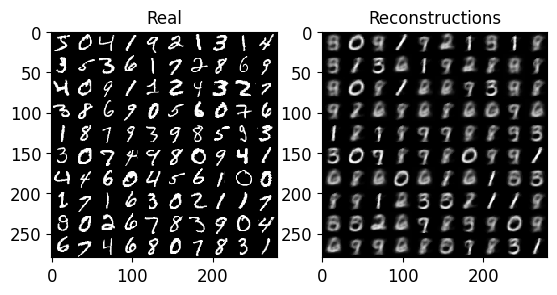

[iter: 701 ]: Training Loss: 0.22
[iter: 702 ]: Training Loss: 0.22
[iter: 703 ]: Training Loss: 0.22
[iter: 704 ]: Training Loss: 0.19
[iter: 705 ]: Training Loss: 0.22
[iter: 706 ]: Training Loss: 0.21
[iter: 707 ]: Training Loss: 0.18
[iter: 708 ]: Training Loss: 0.21
[iter: 709 ]: Training Loss: 0.19
[iter: 710 ]: Training Loss: 0.20
[iter: 711 ]: Training Loss: 0.21
[iter: 712 ]: Training Loss: 0.19
[iter: 713 ]: Training Loss: 0.21
[iter: 714 ]: Training Loss: 0.22
[iter: 715 ]: Training Loss: 0.21
[iter: 716 ]: Training Loss: 0.20
[iter: 717 ]: Training Loss: 0.21
[iter: 718 ]: Training Loss: 0.22
[iter: 719 ]: Training Loss: 0.22
[iter: 720 ]: Training Loss: 0.23
[iter: 721 ]: Training Loss: 0.21
[iter: 722 ]: Training Loss: 0.23
[iter: 723 ]: Training Loss: 0.20
[iter: 724 ]: Training Loss: 0.23
[iter: 725 ]: Training Loss: 0.18
[iter: 726 ]: Training Loss: 0.19
[iter: 727 ]: Training Loss: 0.21
[iter: 728 ]: Training Loss: 0.20
[iter: 729 ]: Training Loss: 0.23
[iter: 730 ]: 

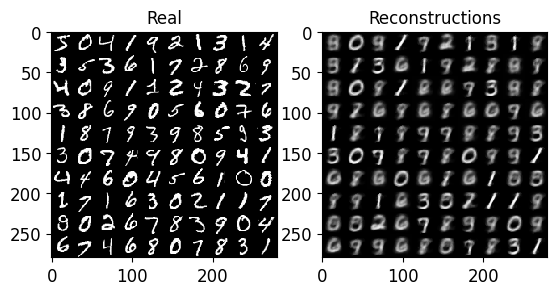

[iter: 751 ]: Training Loss: 0.21
[iter: 752 ]: Training Loss: 0.21
[iter: 753 ]: Training Loss: 0.20
[iter: 754 ]: Training Loss: 0.20
[iter: 755 ]: Training Loss: 0.21
[iter: 756 ]: Training Loss: 0.21
[iter: 757 ]: Training Loss: 0.21
[iter: 758 ]: Training Loss: 0.18
[iter: 759 ]: Training Loss: 0.23
[iter: 760 ]: Training Loss: 0.21
[iter: 761 ]: Training Loss: 0.21
[iter: 762 ]: Training Loss: 0.19
[iter: 763 ]: Training Loss: 0.21
[iter: 764 ]: Training Loss: 0.22
[iter: 765 ]: Training Loss: 0.20
[iter: 766 ]: Training Loss: 0.20
[iter: 767 ]: Training Loss: 0.21
[iter: 768 ]: Training Loss: 0.20
[iter: 769 ]: Training Loss: 0.22
[iter: 770 ]: Training Loss: 0.21
[iter: 771 ]: Training Loss: 0.23
[iter: 772 ]: Training Loss: 0.21
[iter: 773 ]: Training Loss: 0.21
[iter: 774 ]: Training Loss: 0.21
[iter: 775 ]: Training Loss: 0.19
[iter: 776 ]: Training Loss: 0.19
[iter: 777 ]: Training Loss: 0.20
[iter: 778 ]: Training Loss: 0.21
[iter: 779 ]: Training Loss: 0.21
[iter: 780 ]: 

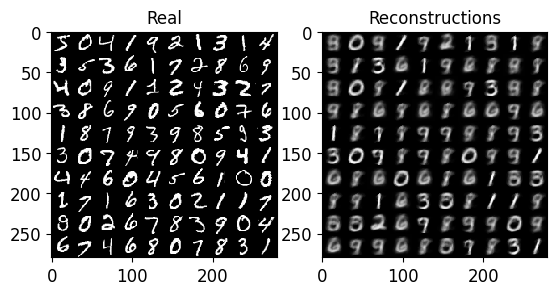

[iter: 801 ]: Training Loss: 0.20
[iter: 802 ]: Training Loss: 0.20
[iter: 803 ]: Training Loss: 0.21
[iter: 804 ]: Training Loss: 0.19
[iter: 805 ]: Training Loss: 0.22
[iter: 806 ]: Training Loss: 0.22
[iter: 807 ]: Training Loss: 0.22
[iter: 808 ]: Training Loss: 0.20
[iter: 809 ]: Training Loss: 0.20
[iter: 810 ]: Training Loss: 0.20
[iter: 811 ]: Training Loss: 0.22
[iter: 812 ]: Training Loss: 0.20
[iter: 813 ]: Training Loss: 0.21
[iter: 814 ]: Training Loss: 0.19
[iter: 815 ]: Training Loss: 0.19
[iter: 816 ]: Training Loss: 0.19
[iter: 817 ]: Training Loss: 0.20
[iter: 818 ]: Training Loss: 0.22
[iter: 819 ]: Training Loss: 0.21
[iter: 820 ]: Training Loss: 0.21
[iter: 821 ]: Training Loss: 0.21
[iter: 822 ]: Training Loss: 0.19
[iter: 823 ]: Training Loss: 0.22
[iter: 824 ]: Training Loss: 0.23
[iter: 825 ]: Training Loss: 0.23
[iter: 826 ]: Training Loss: 0.22
[iter: 827 ]: Training Loss: 0.22
[iter: 828 ]: Training Loss: 0.21
[iter: 829 ]: Training Loss: 0.21
[iter: 830 ]: 

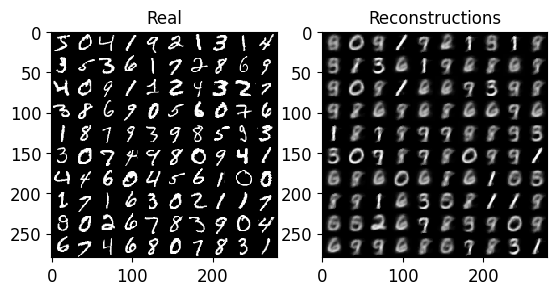

[iter: 851 ]: Training Loss: 0.22
[iter: 852 ]: Training Loss: 0.20
[iter: 853 ]: Training Loss: 0.21
[iter: 854 ]: Training Loss: 0.22
[iter: 855 ]: Training Loss: 0.20
[iter: 856 ]: Training Loss: 0.21
[iter: 857 ]: Training Loss: 0.21
[iter: 858 ]: Training Loss: 0.21
[iter: 859 ]: Training Loss: 0.21
[iter: 860 ]: Training Loss: 0.19
[iter: 861 ]: Training Loss: 0.19
[iter: 862 ]: Training Loss: 0.20
[iter: 863 ]: Training Loss: 0.17
[iter: 864 ]: Training Loss: 0.20
[iter: 865 ]: Training Loss: 0.19
[iter: 866 ]: Training Loss: 0.20
[iter: 867 ]: Training Loss: 0.22
[iter: 868 ]: Training Loss: 0.22
[iter: 869 ]: Training Loss: 0.23
[iter: 870 ]: Training Loss: 0.20
[iter: 871 ]: Training Loss: 0.21
[iter: 872 ]: Training Loss: 0.21
[iter: 873 ]: Training Loss: 0.21
[iter: 874 ]: Training Loss: 0.20
[iter: 875 ]: Training Loss: 0.23
[iter: 876 ]: Training Loss: 0.20
[iter: 877 ]: Training Loss: 0.19
[iter: 878 ]: Training Loss: 0.20
[iter: 879 ]: Training Loss: 0.22
[iter: 880 ]: 

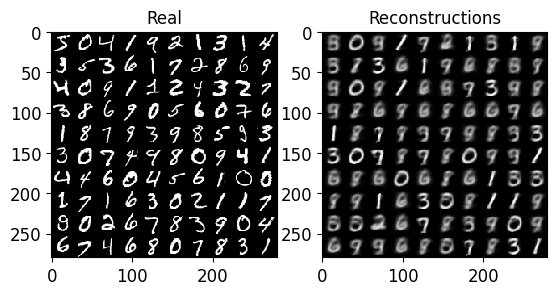

[iter: 901 ]: Training Loss: 0.19
[iter: 902 ]: Training Loss: 0.20
[iter: 903 ]: Training Loss: 0.21
[iter: 904 ]: Training Loss: 0.20
[iter: 905 ]: Training Loss: 0.23
[iter: 906 ]: Training Loss: 0.20
[iter: 907 ]: Training Loss: 0.20
[iter: 908 ]: Training Loss: 0.21
[iter: 909 ]: Training Loss: 0.21
[iter: 910 ]: Training Loss: 0.22
[iter: 911 ]: Training Loss: 0.22
[iter: 912 ]: Training Loss: 0.18
[iter: 913 ]: Training Loss: 0.22
[iter: 914 ]: Training Loss: 0.21
[iter: 915 ]: Training Loss: 0.22
[iter: 916 ]: Training Loss: 0.21
[iter: 917 ]: Training Loss: 0.19
[iter: 918 ]: Training Loss: 0.22
[iter: 919 ]: Training Loss: 0.21
[iter: 920 ]: Training Loss: 0.20
[iter: 921 ]: Training Loss: 0.23
[iter: 922 ]: Training Loss: 0.22
[iter: 923 ]: Training Loss: 0.22
[iter: 924 ]: Training Loss: 0.21
[iter: 925 ]: Training Loss: 0.21
[iter: 926 ]: Training Loss: 0.21
[iter: 927 ]: Training Loss: 0.23
[iter: 928 ]: Training Loss: 0.19
[iter: 929 ]: Training Loss: 0.22
[iter: 930 ]: 

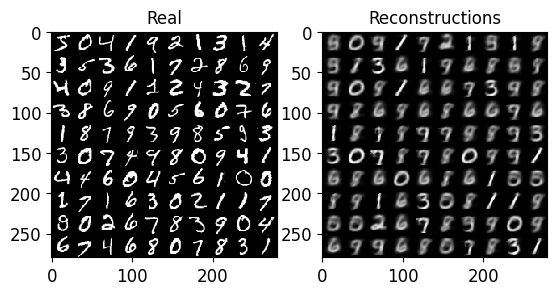

[iter: 951 ]: Training Loss: 0.19
[iter: 952 ]: Training Loss: 0.20
[iter: 953 ]: Training Loss: 0.21
[iter: 954 ]: Training Loss: 0.21
[iter: 955 ]: Training Loss: 0.20
[iter: 956 ]: Training Loss: 0.21
[iter: 957 ]: Training Loss: 0.19
[iter: 958 ]: Training Loss: 0.23
[iter: 959 ]: Training Loss: 0.20
[iter: 960 ]: Training Loss: 0.21
[iter: 961 ]: Training Loss: 0.20
[iter: 962 ]: Training Loss: 0.22
[iter: 963 ]: Training Loss: 0.20
[iter: 964 ]: Training Loss: 0.22
[iter: 965 ]: Training Loss: 0.21
[iter: 966 ]: Training Loss: 0.21
[iter: 967 ]: Training Loss: 0.21
[iter: 968 ]: Training Loss: 0.19
[iter: 969 ]: Training Loss: 0.20
[iter: 970 ]: Training Loss: 0.19
[iter: 971 ]: Training Loss: 0.20
[iter: 972 ]: Training Loss: 0.19
[iter: 973 ]: Training Loss: 0.19
[iter: 974 ]: Training Loss: 0.20
[iter: 975 ]: Training Loss: 0.20
[iter: 976 ]: Training Loss: 0.21
[iter: 977 ]: Training Loss: 0.19
[iter: 978 ]: Training Loss: 0.21
[iter: 979 ]: Training Loss: 0.19
[iter: 980 ]: 

C:\Personal\Uni\3rdYear\Neural Computation\Week 7\autoencoder\utils\plotting.py:53: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, n_images, sharex=False, sharey=False)


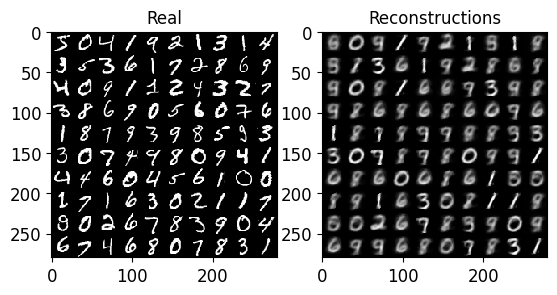

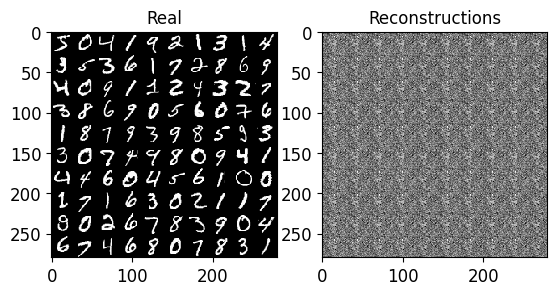

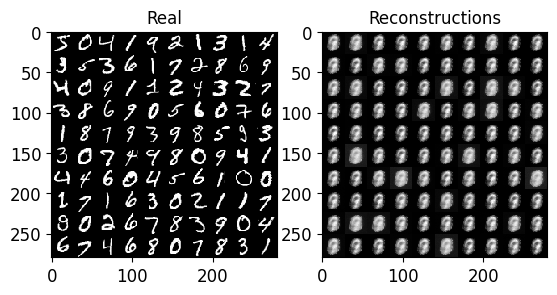

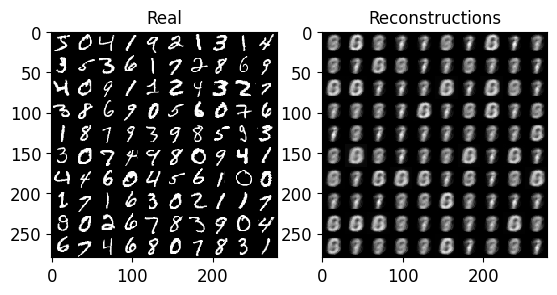

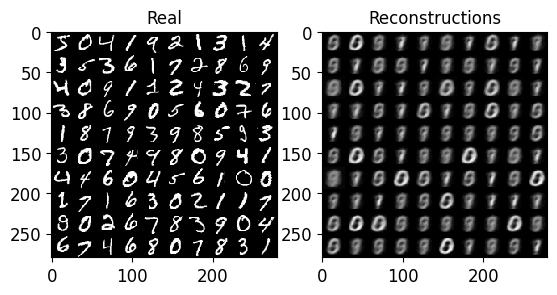

...

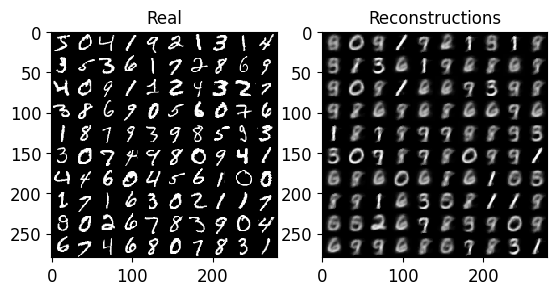

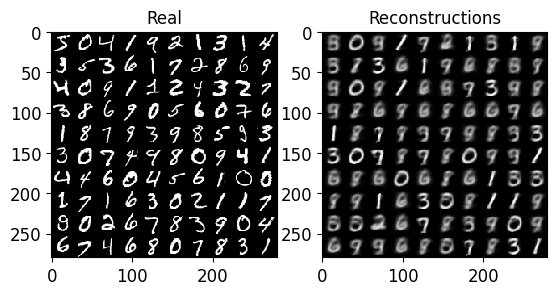

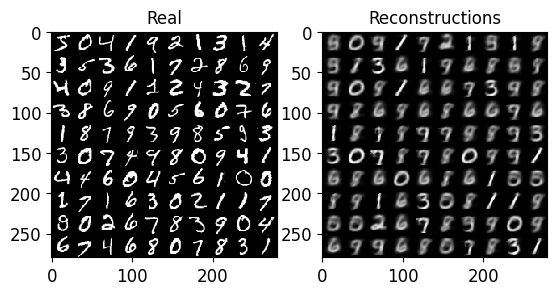

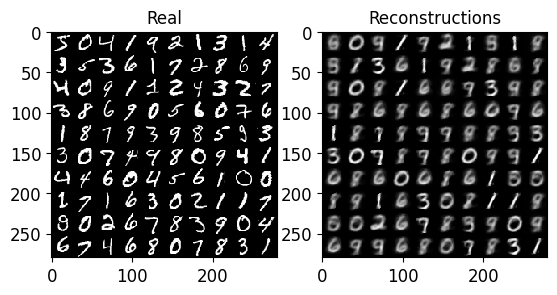

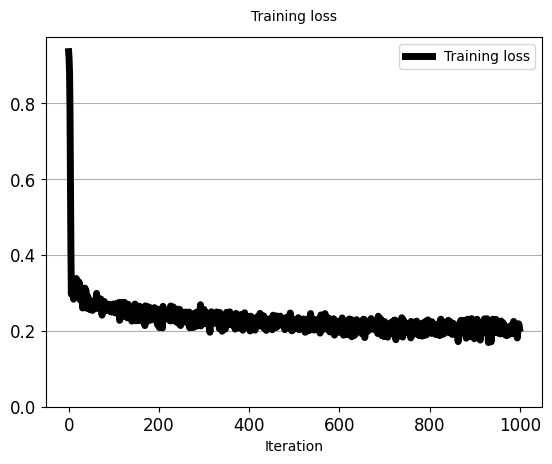

In [8]:
# -*- coding: utf-8 -*-
import torch
import torch.optim as optim
import torch.nn as nn

class Network():
    
    def backward_pass(self, loss):
        # Performs back propagation and computes gradients
        # With PyTorch, we do not need to compute gradients analytically for parameters were requires_grads=True, 
        # Calling loss.backward(), torch's Autograd automatically computes grads of loss wrt each parameter p,...
        # ... and **puts them in p.grad**. Return them in a list.
        loss.backward()
        grads = [param.grad for param in self.params]
        return grads
    
class Autoencoder(Network):
    def __init__(self, rng, D_in, D_hid_enc, D_bottleneck, D_hid_dec):
        # Construct and initialize network parameters
        D_in = D_in # Dimension of input feature-vectors. Length of a vectorised image.
        D_hid_1 = D_hid_enc # Dimension of Encoder's hidden layer
        D_hid_2 = D_bottleneck
        D_hid_3 = D_hid_dec  # Dimension of Decoder's hidden layer
        D_out = D_in # Dimension of Output layer.
        
        self.D_bottleneck = D_bottleneck  # Keep track of it, we will need it.
        
        ##### TODO: Initialize the Auto-Encoder's parameters. Also see forward_pass(...)) ########
        # Dimensions of parameter tensors are (number of neurons + 1) per layer, to account for +1 bias.
        w1_init = rng.normal(loc=0.0, scale=0.01, size=(D_in+1, D_hid_1))
        w2_init = rng.normal(loc=0.0, scale=0.01, size=(D_hid_1+1, D_hid_2))
        w3_init = rng.normal(loc=0.0, scale=0.01, size=(D_hid_2+1, D_hid_3))
        w4_init = rng.normal(loc=0.0, scale=0.01, size=(D_hid_3+1, D_out))
        # Pytorch tensors, parameters of the model
        # Use the above numpy arrays as of random floats as initialization for the Pytorch weights.
        w1 = torch.tensor(w1_init, dtype=torch.float, requires_grad=True)
        w2 = torch.tensor(w2_init, dtype=torch.float, requires_grad=True)
        w3 = torch.tensor(w3_init, dtype=torch.float, requires_grad=True)
        w4 = torch.tensor(w4_init, dtype=torch.float, requires_grad=True)
        # Keep track of all trainable parameters:
        self.params = [w1, w2, w3, w4]
        ###########################################################################
        
        
    def forward_pass(self, batch_imgs):
        # Get parameters
        [w1, w2, w3, w4] = self.params
        
        batch_imgs_t = torch.tensor(batch_imgs, dtype=torch.float)  # Makes pytorch array to pytorch tensor.
        
        unary_feature_for_bias = torch.ones(size=(batch_imgs.shape[0], 1)) # [N, 1] column vector.
        x = torch.cat((batch_imgs_t, unary_feature_for_bias), dim=1) # Extra feature=1 for bias.
        
        #### TODO: Implement the operations at each layer #####
         # Layer 1
        h1_preact = x.mm(w1)
        h1_act = h1_preact.clamp(min=0)
        # Layer 2 (bottleneck):
        h1_ext = torch.cat((h1_act, unary_feature_for_bias), dim=1)
        h2_preact = h1_ext.mm(w2)
        h2_act = h2_preact.clamp(min=0) ###<--- Z representation
        # Layer 3:
        h2_ext = torch.cat((h2_act, unary_feature_for_bias), dim=1)
        h3_preact = h2_ext.mm(w3)
        h3_act = h3_preact.clamp(min=0)
        # Layer 4 (output):
        h3_ext = torch.cat((h3_act, unary_feature_for_bias), dim=1)
        h4_preact = h3_ext.mm(w4)
        h4_act = torch.tanh(h4_preact)
        # Output layer
        x_pred = h4_act
        #######################################################
        
        ### TODO: Get bottleneck's activations ######
        # Bottleneck actications
        z_code = h2_act
        #############################################
                
        return (x_pred, z_code)
        
        
def reconstruction_loss(x_pred, x_real, eps=1e-7):
    # x_pred: [N, D_out] Prediction returned by forward_pass. Numpy array of shape [N, D_out]
    # x_real: [N, D_in]
    
    # If number array is given, change it to a Torch tensor.
    x_pred = torch.tensor(x_pred, dtype=torch.float) if type(x_pred) is np.ndarray else x_pred
    x_real = torch.tensor(x_real, dtype=torch.float) if type(x_real) is np.ndarray else x_real
    
    ######## TODO: Complete the calculation of Reconstruction loss for each sample ###########
    loss_recon = torch.mean(torch.square(x_pred - x_real), dim=1)
    ##########################################################################################
    
    cost = torch.mean(loss_recon, dim=0) # Expectation of loss: Mean over samples (axis=0).
    return cost


# Create the network
rng = np.random.RandomState(seed=SEED)
autoencoder_thin = Autoencoder(rng=rng,
                               D_in=H_height*W_width,
                               D_hid_enc=256,
                               D_bottleneck=2,
                               D_hid_dec=256)
# Start training
unsupervised_training_AE(autoencoder_thin,
                         reconstruction_loss,
                         rng,
                         train_imgs_flat,
                         batch_size=40,
                         learning_rate=3e-3,
                         total_iters=1000,
                         iters_per_recon_plot=50)


If this task is completed correctly, the AutoEncoder should get trained, and you should see the loss decreasing.\
In the end of training, after 1000 iterations, you will see a curve of the training loss.\
The loss should decrease down to approximately 0.2.

You should also see printed side by side a set of real images, and their reconstructed version.\
In the end, the reconstructions should start being reasonable.

## Task 3: Encode all training samples in the latent (bottleneck) representation

We have now a trained auto-encoder from the above task. We will now use it to encode training data, obtain the codes z for the training data, and plot the first 2 dimensions of Z in a 2D plot to observe how the codes are clustered. (Note: The original notebook should have implementation in the above task of an AE with a bottleneck layer with 2 neurons, therefore making plotting in 2D space easy).

Note: The code below is fully implemented. Run it, and observe the output. Think about the questions below the results...


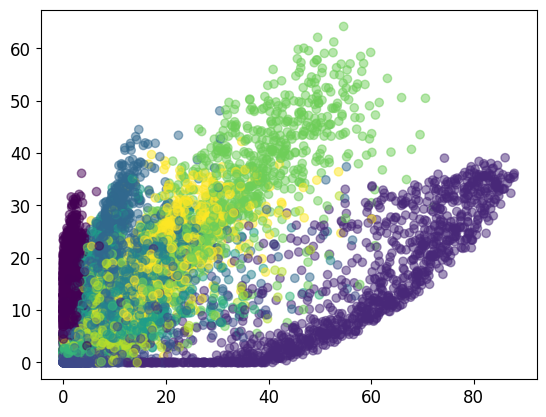

Min Z value per dimension of bottleneck: [0. 0.]
Max Z value per dimension of bottleneck: [87.92656 64.17436]


In [9]:
import matplotlib.pyplot as plt

def encode_and_get_min_max_z(net,
                             imgs_flat,
                             lbls,
                             batch_size,
                             total_iterations=None,
                             plot_2d_embedding=True):
    # This function encodes images, plots the first 2 dimensions of the codes in a plot, and finally...
    # ... returns the minimum and maximum values of the codes for each dimensions of Z.
    # ... We will use  this at a layer task.
    # Arguments:
    # imgs_flat: Numpy array of shape [Number of images, H * W]
    # lbls: Numpy array of shape [number of images], with 1 integer per image. The integer is the class (digit).
    # total_iterations: How many batches to encode. We will use this so that we dont encode and plot ...
    # ... the whoooole training database, because the plot will get cluttered with 60000 points.
    # Returns:
    # min_z: numpy array, vector with [dimensions-of-z] elements. Minimum value per dimension of z.
    # max_z: numpy array, vector with [dimensions-of-z] elements. Maximum value per dimension of z.
    
    # If total iterations is None, the function will just iterate over all data, by breaking them into batches.    
    if total_iterations is None:
        total_iterations = (train_imgs_flat.shape[0] - 1) // batch_size + 1
    
    z_codes_all = []
    lbls_all = []
    for t in range(total_iterations):
        # Sample batch for this SGD iteration
        x_batch = imgs_flat[t*batch_size: (t+1)*batch_size]
        lbls_batch = lbls[t*batch_size: (t+1)*batch_size]
        
        # Forward pass
        x_pred, z_codes = net.forward_pass(x_batch)

        z_codes_np = z_codes if type(z_codes) is np.ndarray else z_codes.detach().numpy()
        
        z_codes_all.append(z_codes_np)  # List of np.arrays
        lbls_all.append(lbls_batch)
    
    z_codes_all = np.concatenate(z_codes_all)  # Make list of arrays in one array by concatenating along dim=0 (image index)
    lbls_all = np.concatenate(lbls_all)
    
    if plot_2d_embedding:
        # Plot the codes with different color per class in a scatter plot:
        plt.scatter(z_codes_all[:,0], z_codes_all[:,1], c=lbls_all, alpha=0.5)  # Plot the first 2 dimensions.
        plt.show()
    
    # Get the minimum and maximum values of z per dimension (neuron) of Z. We will use this at a later task
    min_z = np.min(z_codes_all, axis=0)  # min and max for each dimension of z, over all samples.
    max_z = np.max(z_codes_all, axis=0)  # Numpy array (vector) of shape [number of z dimensions]
    
    return min_z, max_z


# Encode training samples, and get the min and max values of the z codes (for each dimension)
min_z, max_z = encode_and_get_min_max_z(autoencoder_thin,
                                        train_imgs_flat,
                                        train_lbls,
                                        batch_size=100,
                                        total_iterations=100)
print("Min Z value per dimension of bottleneck:", min_z)
print("Max Z value per dimension of bottleneck:", max_z)


If all went well, you should see a plot where the codes span from 0 to +80 (approx).\

**Questions:**
- Why dont we have negative values in these codes? Is this a general property of AutoEncoders, or of the specific implementation?\
- What do you observe about how codes of different classes (colors) are grouped? Do similar samples seem to be encoded far or close? Why is the AE learning in this way?
- Is the space of Z full of samples everywhere, or are there holes? Why?

## Task 4: Train an Auto-Encoder with a larger bottleneck layer

The smaller the bottleneck layer (less neurons), the less information is allowed to be encoded for the inputs.\
We previously constructed and trained an AE with only 2 neurons in the bottleneck layer. Quite a restriction!\

We will now train an AE with a larger bottleneck layer to observe the difference in loss and how well are images reconstructed.

Below, train an AE with a bottleneck layer of 32 neurons. Then think about the questions further below...

[iter: 0 ]: Training Loss: 0.94


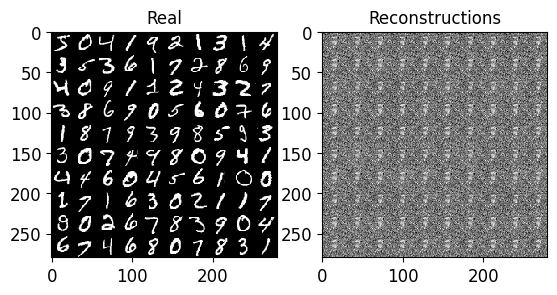

[iter: 1 ]: Training Loss: 0.91
[iter: 2 ]: Training Loss: 0.81
[iter: 3 ]: Training Loss: 0.58
[iter: 4 ]: Training Loss: 0.36
[iter: 5 ]: Training Loss: 0.32
[iter: 6 ]: Training Loss: 0.34
[iter: 7 ]: Training Loss: 0.34
[iter: 8 ]: Training Loss: 0.33
[iter: 9 ]: Training Loss: 0.38
[iter: 10 ]: Training Loss: 0.36
[iter: 11 ]: Training Loss: 0.32
[iter: 12 ]: Training Loss: 0.34
[iter: 13 ]: Training Loss: 0.33
[iter: 14 ]: Training Loss: 0.37
[iter: 15 ]: Training Loss: 0.35
[iter: 16 ]: Training Loss: 0.34
[iter: 17 ]: Training Loss: 0.35
[iter: 18 ]: Training Loss: 0.32
[iter: 19 ]: Training Loss: 0.30
[iter: 20 ]: Training Loss: 0.32
[iter: 21 ]: Training Loss: 0.29
[iter: 22 ]: Training Loss: 0.30
[iter: 23 ]: Training Loss: 0.32
[iter: 24 ]: Training Loss: 0.32
[iter: 25 ]: Training Loss: 0.29
[iter: 26 ]: Training Loss: 0.30
[iter: 27 ]: Training Loss: 0.27
[iter: 28 ]: Training Loss: 0.30
[iter: 29 ]: Training Loss: 0.26
[iter: 30 ]: Training Loss: 0.30
[iter: 31 ]: Traini

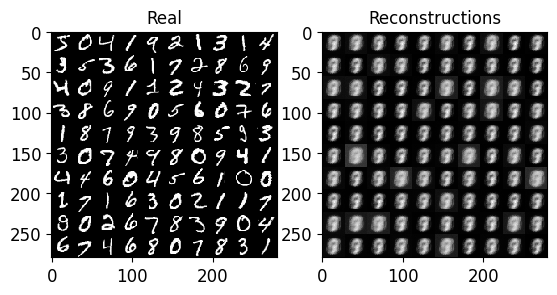

[iter: 51 ]: Training Loss: 0.26
[iter: 52 ]: Training Loss: 0.28
[iter: 53 ]: Training Loss: 0.28
[iter: 54 ]: Training Loss: 0.25
[iter: 55 ]: Training Loss: 0.27
[iter: 56 ]: Training Loss: 0.27
[iter: 57 ]: Training Loss: 0.27
[iter: 58 ]: Training Loss: 0.28
[iter: 59 ]: Training Loss: 0.28
[iter: 60 ]: Training Loss: 0.26
[iter: 61 ]: Training Loss: 0.28
[iter: 62 ]: Training Loss: 0.27
[iter: 63 ]: Training Loss: 0.26
[iter: 64 ]: Training Loss: 0.28
[iter: 65 ]: Training Loss: 0.28
[iter: 66 ]: Training Loss: 0.26
[iter: 67 ]: Training Loss: 0.27
[iter: 68 ]: Training Loss: 0.26
[iter: 69 ]: Training Loss: 0.25
[iter: 70 ]: Training Loss: 0.28
[iter: 71 ]: Training Loss: 0.28
[iter: 72 ]: Training Loss: 0.25
[iter: 73 ]: Training Loss: 0.26
[iter: 74 ]: Training Loss: 0.27
[iter: 75 ]: Training Loss: 0.27
[iter: 76 ]: Training Loss: 0.25
[iter: 77 ]: Training Loss: 0.26
[iter: 78 ]: Training Loss: 0.27
[iter: 79 ]: Training Loss: 0.27
[iter: 80 ]: Training Loss: 0.27
[iter: 81 

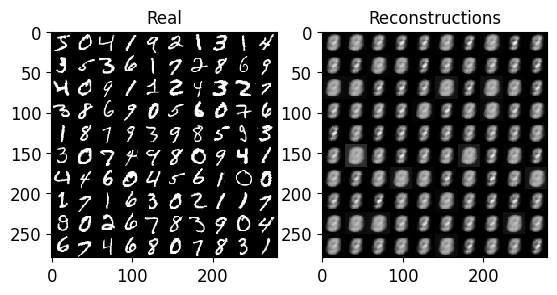

[iter: 101 ]: Training Loss: 0.27
[iter: 102 ]: Training Loss: 0.27
[iter: 103 ]: Training Loss: 0.27
[iter: 104 ]: Training Loss: 0.25
[iter: 105 ]: Training Loss: 0.28
[iter: 106 ]: Training Loss: 0.26
[iter: 107 ]: Training Loss: 0.25
[iter: 108 ]: Training Loss: 0.27
[iter: 109 ]: Training Loss: 0.26
[iter: 110 ]: Training Loss: 0.26
[iter: 111 ]: Training Loss: 0.26
[iter: 112 ]: Training Loss: 0.28
[iter: 113 ]: Training Loss: 0.24
[iter: 114 ]: Training Loss: 0.28
[iter: 115 ]: Training Loss: 0.27
[iter: 116 ]: Training Loss: 0.25
[iter: 117 ]: Training Loss: 0.25
[iter: 118 ]: Training Loss: 0.25
[iter: 119 ]: Training Loss: 0.25
[iter: 120 ]: Training Loss: 0.26
[iter: 121 ]: Training Loss: 0.25
[iter: 122 ]: Training Loss: 0.24
[iter: 123 ]: Training Loss: 0.28
[iter: 124 ]: Training Loss: 0.27
[iter: 125 ]: Training Loss: 0.27
[iter: 126 ]: Training Loss: 0.25
[iter: 127 ]: Training Loss: 0.27
[iter: 128 ]: Training Loss: 0.24
[iter: 129 ]: Training Loss: 0.28
[iter: 130 ]: 

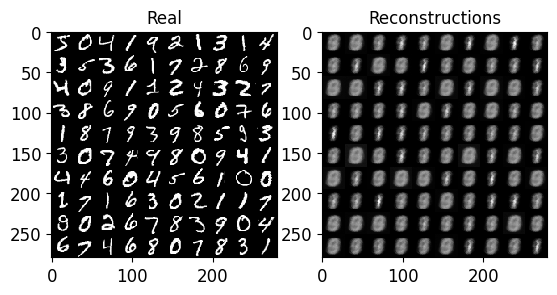

[iter: 151 ]: Training Loss: 0.26
[iter: 152 ]: Training Loss: 0.28
[iter: 153 ]: Training Loss: 0.26
[iter: 154 ]: Training Loss: 0.27
[iter: 155 ]: Training Loss: 0.26
[iter: 156 ]: Training Loss: 0.24
[iter: 157 ]: Training Loss: 0.24
[iter: 158 ]: Training Loss: 0.26
[iter: 159 ]: Training Loss: 0.27
[iter: 160 ]: Training Loss: 0.25
[iter: 161 ]: Training Loss: 0.26
[iter: 162 ]: Training Loss: 0.25
[iter: 163 ]: Training Loss: 0.25
[iter: 164 ]: Training Loss: 0.24
[iter: 165 ]: Training Loss: 0.26
[iter: 166 ]: Training Loss: 0.25
[iter: 167 ]: Training Loss: 0.27
[iter: 168 ]: Training Loss: 0.26
[iter: 169 ]: Training Loss: 0.23
[iter: 170 ]: Training Loss: 0.24
[iter: 171 ]: Training Loss: 0.26
[iter: 172 ]: Training Loss: 0.24
[iter: 173 ]: Training Loss: 0.26
[iter: 174 ]: Training Loss: 0.25
[iter: 175 ]: Training Loss: 0.23
[iter: 176 ]: Training Loss: 0.24
[iter: 177 ]: Training Loss: 0.26
[iter: 178 ]: Training Loss: 0.23
[iter: 179 ]: Training Loss: 0.25
[iter: 180 ]: 

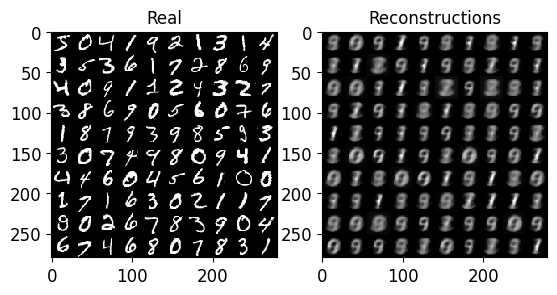

[iter: 201 ]: Training Loss: 0.24
[iter: 202 ]: Training Loss: 0.24
[iter: 203 ]: Training Loss: 0.23
[iter: 204 ]: Training Loss: 0.25
[iter: 205 ]: Training Loss: 0.24
[iter: 206 ]: Training Loss: 0.25
[iter: 207 ]: Training Loss: 0.26
[iter: 208 ]: Training Loss: 0.26
[iter: 209 ]: Training Loss: 0.23
[iter: 210 ]: Training Loss: 0.23
[iter: 211 ]: Training Loss: 0.23
[iter: 212 ]: Training Loss: 0.24
[iter: 213 ]: Training Loss: 0.25
[iter: 214 ]: Training Loss: 0.24
[iter: 215 ]: Training Loss: 0.26
[iter: 216 ]: Training Loss: 0.23
[iter: 217 ]: Training Loss: 0.23
[iter: 218 ]: Training Loss: 0.23
[iter: 219 ]: Training Loss: 0.22
[iter: 220 ]: Training Loss: 0.26
[iter: 221 ]: Training Loss: 0.23
[iter: 222 ]: Training Loss: 0.26
[iter: 223 ]: Training Loss: 0.25
[iter: 224 ]: Training Loss: 0.23
[iter: 225 ]: Training Loss: 0.24
[iter: 226 ]: Training Loss: 0.23
[iter: 227 ]: Training Loss: 0.25
[iter: 228 ]: Training Loss: 0.23
[iter: 229 ]: Training Loss: 0.22
[iter: 230 ]: 

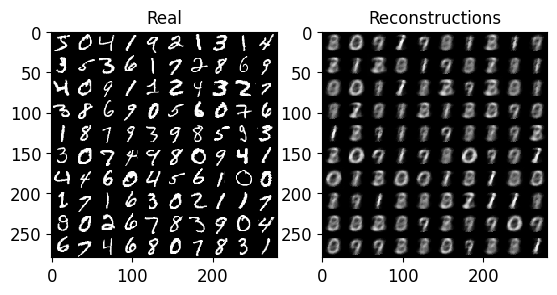

[iter: 251 ]: Training Loss: 0.22
[iter: 252 ]: Training Loss: 0.22
[iter: 253 ]: Training Loss: 0.22
[iter: 254 ]: Training Loss: 0.24
[iter: 255 ]: Training Loss: 0.22
[iter: 256 ]: Training Loss: 0.20
[iter: 257 ]: Training Loss: 0.22
[iter: 258 ]: Training Loss: 0.20
[iter: 259 ]: Training Loss: 0.23
[iter: 260 ]: Training Loss: 0.23
[iter: 261 ]: Training Loss: 0.23
[iter: 262 ]: Training Loss: 0.24
[iter: 263 ]: Training Loss: 0.23
[iter: 264 ]: Training Loss: 0.23
[iter: 265 ]: Training Loss: 0.21
[iter: 266 ]: Training Loss: 0.22
[iter: 267 ]: Training Loss: 0.23
[iter: 268 ]: Training Loss: 0.22
[iter: 269 ]: Training Loss: 0.23
[iter: 270 ]: Training Loss: 0.23
[iter: 271 ]: Training Loss: 0.21
[iter: 272 ]: Training Loss: 0.22
[iter: 273 ]: Training Loss: 0.23
[iter: 274 ]: Training Loss: 0.21
[iter: 275 ]: Training Loss: 0.24
[iter: 276 ]: Training Loss: 0.22
[iter: 277 ]: Training Loss: 0.20
[iter: 278 ]: Training Loss: 0.22
[iter: 279 ]: Training Loss: 0.24
[iter: 280 ]: 

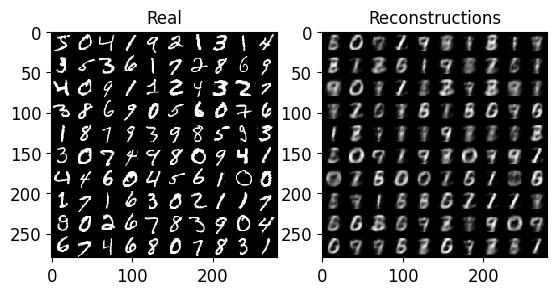

[iter: 301 ]: Training Loss: 0.19
[iter: 302 ]: Training Loss: 0.18
[iter: 303 ]: Training Loss: 0.21
[iter: 304 ]: Training Loss: 0.21
[iter: 305 ]: Training Loss: 0.21
[iter: 306 ]: Training Loss: 0.21
[iter: 307 ]: Training Loss: 0.21
[iter: 308 ]: Training Loss: 0.20
[iter: 309 ]: Training Loss: 0.20
[iter: 310 ]: Training Loss: 0.21
[iter: 311 ]: Training Loss: 0.21
[iter: 312 ]: Training Loss: 0.22
[iter: 313 ]: Training Loss: 0.19
[iter: 314 ]: Training Loss: 0.21
[iter: 315 ]: Training Loss: 0.22
[iter: 316 ]: Training Loss: 0.20
[iter: 317 ]: Training Loss: 0.21
[iter: 318 ]: Training Loss: 0.21
[iter: 319 ]: Training Loss: 0.22
[iter: 320 ]: Training Loss: 0.19
[iter: 321 ]: Training Loss: 0.22
[iter: 322 ]: Training Loss: 0.20
[iter: 323 ]: Training Loss: 0.22
[iter: 324 ]: Training Loss: 0.21
[iter: 325 ]: Training Loss: 0.21
[iter: 326 ]: Training Loss: 0.20
[iter: 327 ]: Training Loss: 0.20
[iter: 328 ]: Training Loss: 0.20
[iter: 329 ]: Training Loss: 0.20
[iter: 330 ]: 

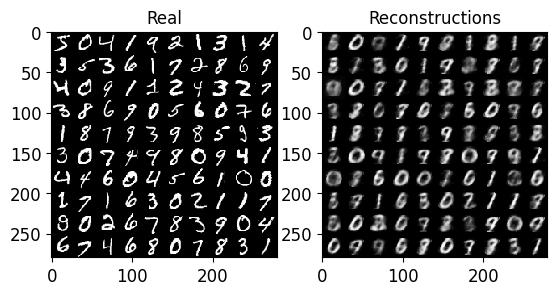

[iter: 351 ]: Training Loss: 0.20
[iter: 352 ]: Training Loss: 0.16
[iter: 353 ]: Training Loss: 0.17
[iter: 354 ]: Training Loss: 0.19
[iter: 355 ]: Training Loss: 0.20
[iter: 356 ]: Training Loss: 0.19
[iter: 357 ]: Training Loss: 0.19
[iter: 358 ]: Training Loss: 0.17
[iter: 359 ]: Training Loss: 0.17
[iter: 360 ]: Training Loss: 0.19
[iter: 361 ]: Training Loss: 0.18
[iter: 362 ]: Training Loss: 0.18
[iter: 363 ]: Training Loss: 0.19
[iter: 364 ]: Training Loss: 0.19
[iter: 365 ]: Training Loss: 0.18
[iter: 366 ]: Training Loss: 0.18
[iter: 367 ]: Training Loss: 0.18
[iter: 368 ]: Training Loss: 0.19
[iter: 369 ]: Training Loss: 0.18
[iter: 370 ]: Training Loss: 0.19
[iter: 371 ]: Training Loss: 0.19
[iter: 372 ]: Training Loss: 0.17
[iter: 373 ]: Training Loss: 0.18
[iter: 374 ]: Training Loss: 0.19
[iter: 375 ]: Training Loss: 0.18
[iter: 376 ]: Training Loss: 0.19
[iter: 377 ]: Training Loss: 0.16
[iter: 378 ]: Training Loss: 0.16
[iter: 379 ]: Training Loss: 0.17
[iter: 380 ]: 

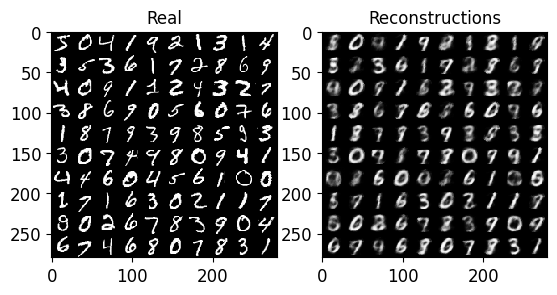

[iter: 401 ]: Training Loss: 0.17
[iter: 402 ]: Training Loss: 0.17
[iter: 403 ]: Training Loss: 0.18
[iter: 404 ]: Training Loss: 0.18
[iter: 405 ]: Training Loss: 0.16
[iter: 406 ]: Training Loss: 0.17
[iter: 407 ]: Training Loss: 0.16
[iter: 408 ]: Training Loss: 0.18
[iter: 409 ]: Training Loss: 0.17
[iter: 410 ]: Training Loss: 0.16
[iter: 411 ]: Training Loss: 0.16
[iter: 412 ]: Training Loss: 0.17
[iter: 413 ]: Training Loss: 0.16
[iter: 414 ]: Training Loss: 0.18
[iter: 415 ]: Training Loss: 0.16
[iter: 416 ]: Training Loss: 0.17
[iter: 417 ]: Training Loss: 0.18
[iter: 418 ]: Training Loss: 0.17
[iter: 419 ]: Training Loss: 0.15
[iter: 420 ]: Training Loss: 0.17
[iter: 421 ]: Training Loss: 0.16
[iter: 422 ]: Training Loss: 0.16
[iter: 423 ]: Training Loss: 0.17
[iter: 424 ]: Training Loss: 0.16
[iter: 425 ]: Training Loss: 0.16
[iter: 426 ]: Training Loss: 0.15
[iter: 427 ]: Training Loss: 0.16
[iter: 428 ]: Training Loss: 0.14
[iter: 429 ]: Training Loss: 0.15
[iter: 430 ]: 

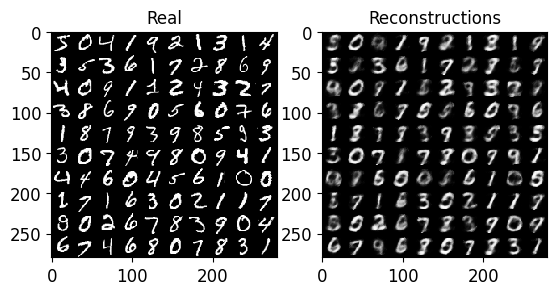

[iter: 451 ]: Training Loss: 0.16
[iter: 452 ]: Training Loss: 0.15
[iter: 453 ]: Training Loss: 0.14
[iter: 454 ]: Training Loss: 0.15
[iter: 455 ]: Training Loss: 0.16
[iter: 456 ]: Training Loss: 0.17
[iter: 457 ]: Training Loss: 0.17
[iter: 458 ]: Training Loss: 0.16
[iter: 459 ]: Training Loss: 0.14
[iter: 460 ]: Training Loss: 0.15
[iter: 461 ]: Training Loss: 0.14
[iter: 462 ]: Training Loss: 0.16
[iter: 463 ]: Training Loss: 0.15
[iter: 464 ]: Training Loss: 0.15
[iter: 465 ]: Training Loss: 0.14
[iter: 466 ]: Training Loss: 0.16
[iter: 467 ]: Training Loss: 0.14
[iter: 468 ]: Training Loss: 0.15
[iter: 469 ]: Training Loss: 0.15
[iter: 470 ]: Training Loss: 0.14
[iter: 471 ]: Training Loss: 0.14
[iter: 472 ]: Training Loss: 0.14
[iter: 473 ]: Training Loss: 0.13
[iter: 474 ]: Training Loss: 0.16
[iter: 475 ]: Training Loss: 0.13
[iter: 476 ]: Training Loss: 0.16
[iter: 477 ]: Training Loss: 0.15
[iter: 478 ]: Training Loss: 0.16
[iter: 479 ]: Training Loss: 0.16
[iter: 480 ]: 

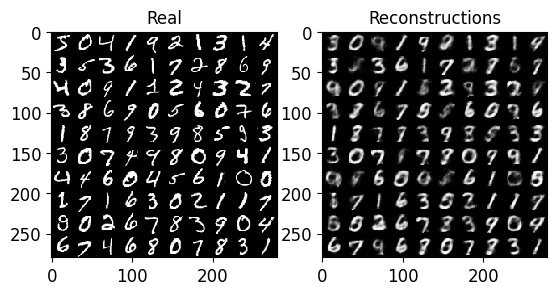

[iter: 501 ]: Training Loss: 0.15
[iter: 502 ]: Training Loss: 0.15
[iter: 503 ]: Training Loss: 0.17
[iter: 504 ]: Training Loss: 0.13
[iter: 505 ]: Training Loss: 0.14
[iter: 506 ]: Training Loss: 0.15
[iter: 507 ]: Training Loss: 0.14
[iter: 508 ]: Training Loss: 0.13
[iter: 509 ]: Training Loss: 0.14
[iter: 510 ]: Training Loss: 0.15
[iter: 511 ]: Training Loss: 0.14
[iter: 512 ]: Training Loss: 0.15
[iter: 513 ]: Training Loss: 0.16
[iter: 514 ]: Training Loss: 0.13
[iter: 515 ]: Training Loss: 0.15
[iter: 516 ]: Training Loss: 0.14
[iter: 517 ]: Training Loss: 0.15
[iter: 518 ]: Training Loss: 0.15
[iter: 519 ]: Training Loss: 0.15
[iter: 520 ]: Training Loss: 0.14
[iter: 521 ]: Training Loss: 0.14
[iter: 522 ]: Training Loss: 0.14
[iter: 523 ]: Training Loss: 0.14
[iter: 524 ]: Training Loss: 0.16
[iter: 525 ]: Training Loss: 0.15
[iter: 526 ]: Training Loss: 0.14
[iter: 527 ]: Training Loss: 0.13
[iter: 528 ]: Training Loss: 0.14
[iter: 529 ]: Training Loss: 0.14
[iter: 530 ]: 

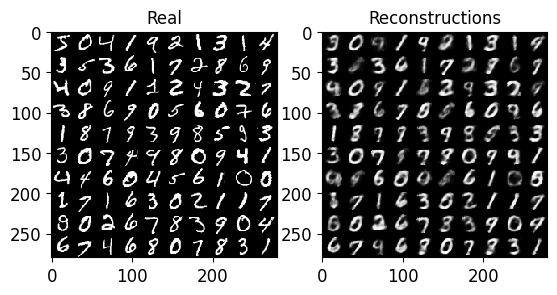

[iter: 551 ]: Training Loss: 0.13
[iter: 552 ]: Training Loss: 0.13
[iter: 553 ]: Training Loss: 0.12
[iter: 554 ]: Training Loss: 0.15
[iter: 555 ]: Training Loss: 0.14
[iter: 556 ]: Training Loss: 0.13
[iter: 557 ]: Training Loss: 0.15
[iter: 558 ]: Training Loss: 0.13
[iter: 559 ]: Training Loss: 0.13
[iter: 560 ]: Training Loss: 0.13
[iter: 561 ]: Training Loss: 0.14
[iter: 562 ]: Training Loss: 0.13
[iter: 563 ]: Training Loss: 0.13
[iter: 564 ]: Training Loss: 0.14
[iter: 565 ]: Training Loss: 0.13
[iter: 566 ]: Training Loss: 0.14
[iter: 567 ]: Training Loss: 0.14
[iter: 568 ]: Training Loss: 0.14
[iter: 569 ]: Training Loss: 0.12
[iter: 570 ]: Training Loss: 0.13
[iter: 571 ]: Training Loss: 0.14
[iter: 572 ]: Training Loss: 0.12
[iter: 573 ]: Training Loss: 0.14
[iter: 574 ]: Training Loss: 0.13
[iter: 575 ]: Training Loss: 0.14
[iter: 576 ]: Training Loss: 0.13
[iter: 577 ]: Training Loss: 0.12
[iter: 578 ]: Training Loss: 0.14
[iter: 579 ]: Training Loss: 0.14
[iter: 580 ]: 

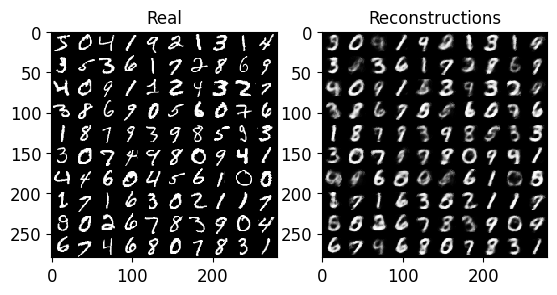

[iter: 601 ]: Training Loss: 0.15
[iter: 602 ]: Training Loss: 0.14
[iter: 603 ]: Training Loss: 0.14
[iter: 604 ]: Training Loss: 0.12
[iter: 605 ]: Training Loss: 0.12
[iter: 606 ]: Training Loss: 0.15
[iter: 607 ]: Training Loss: 0.14
[iter: 608 ]: Training Loss: 0.12
[iter: 609 ]: Training Loss: 0.13
[iter: 610 ]: Training Loss: 0.13
[iter: 611 ]: Training Loss: 0.13
[iter: 612 ]: Training Loss: 0.14
[iter: 613 ]: Training Loss: 0.12
[iter: 614 ]: Training Loss: 0.14
[iter: 615 ]: Training Loss: 0.14
[iter: 616 ]: Training Loss: 0.13
[iter: 617 ]: Training Loss: 0.13
[iter: 618 ]: Training Loss: 0.12
[iter: 619 ]: Training Loss: 0.13
[iter: 620 ]: Training Loss: 0.13
[iter: 621 ]: Training Loss: 0.12
[iter: 622 ]: Training Loss: 0.11
[iter: 623 ]: Training Loss: 0.12
[iter: 624 ]: Training Loss: 0.14
[iter: 625 ]: Training Loss: 0.12
[iter: 626 ]: Training Loss: 0.12
[iter: 627 ]: Training Loss: 0.12
[iter: 628 ]: Training Loss: 0.12
[iter: 629 ]: Training Loss: 0.13
[iter: 630 ]: 

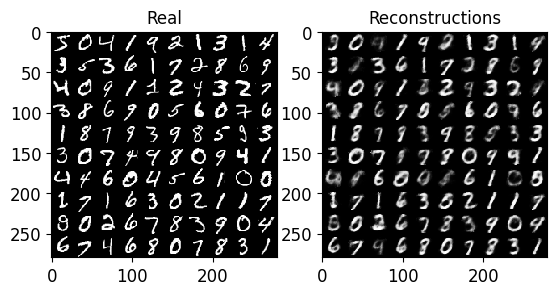

[iter: 651 ]: Training Loss: 0.12
[iter: 652 ]: Training Loss: 0.12
[iter: 653 ]: Training Loss: 0.13
[iter: 654 ]: Training Loss: 0.14
[iter: 655 ]: Training Loss: 0.13
[iter: 656 ]: Training Loss: 0.13
[iter: 657 ]: Training Loss: 0.12
[iter: 658 ]: Training Loss: 0.14
[iter: 659 ]: Training Loss: 0.14
[iter: 660 ]: Training Loss: 0.11
[iter: 661 ]: Training Loss: 0.12
[iter: 662 ]: Training Loss: 0.14
[iter: 663 ]: Training Loss: 0.14
[iter: 664 ]: Training Loss: 0.13
[iter: 665 ]: Training Loss: 0.13
[iter: 666 ]: Training Loss: 0.13
[iter: 667 ]: Training Loss: 0.12
[iter: 668 ]: Training Loss: 0.12
[iter: 669 ]: Training Loss: 0.12
[iter: 670 ]: Training Loss: 0.13
[iter: 671 ]: Training Loss: 0.12
[iter: 672 ]: Training Loss: 0.12
[iter: 673 ]: Training Loss: 0.13
[iter: 674 ]: Training Loss: 0.13
[iter: 675 ]: Training Loss: 0.13
[iter: 676 ]: Training Loss: 0.13
[iter: 677 ]: Training Loss: 0.12
[iter: 678 ]: Training Loss: 0.11
[iter: 679 ]: Training Loss: 0.13
[iter: 680 ]: 

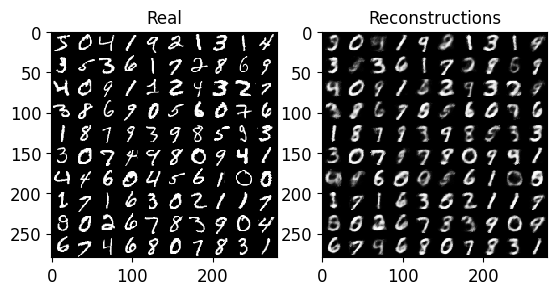

[iter: 701 ]: Training Loss: 0.11
[iter: 702 ]: Training Loss: 0.13
[iter: 703 ]: Training Loss: 0.12
[iter: 704 ]: Training Loss: 0.12
[iter: 705 ]: Training Loss: 0.12
[iter: 706 ]: Training Loss: 0.11
[iter: 707 ]: Training Loss: 0.12
[iter: 708 ]: Training Loss: 0.12
[iter: 709 ]: Training Loss: 0.13
[iter: 710 ]: Training Loss: 0.12
[iter: 711 ]: Training Loss: 0.11
[iter: 712 ]: Training Loss: 0.13
[iter: 713 ]: Training Loss: 0.12
[iter: 714 ]: Training Loss: 0.12
[iter: 715 ]: Training Loss: 0.11
[iter: 716 ]: Training Loss: 0.11
[iter: 717 ]: Training Loss: 0.11
[iter: 718 ]: Training Loss: 0.12
[iter: 719 ]: Training Loss: 0.12
[iter: 720 ]: Training Loss: 0.13
[iter: 721 ]: Training Loss: 0.11
[iter: 722 ]: Training Loss: 0.12
[iter: 723 ]: Training Loss: 0.12
[iter: 724 ]: Training Loss: 0.13
[iter: 725 ]: Training Loss: 0.12
[iter: 726 ]: Training Loss: 0.12
[iter: 727 ]: Training Loss: 0.13
[iter: 728 ]: Training Loss: 0.14
[iter: 729 ]: Training Loss: 0.12
[iter: 730 ]: 

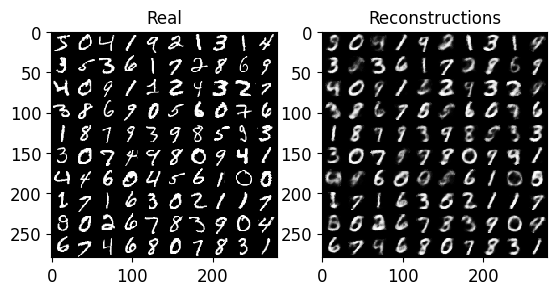

[iter: 751 ]: Training Loss: 0.13
[iter: 752 ]: Training Loss: 0.13
[iter: 753 ]: Training Loss: 0.12
[iter: 754 ]: Training Loss: 0.10
[iter: 755 ]: Training Loss: 0.12
[iter: 756 ]: Training Loss: 0.11
[iter: 757 ]: Training Loss: 0.12
[iter: 758 ]: Training Loss: 0.12
[iter: 759 ]: Training Loss: 0.11
[iter: 760 ]: Training Loss: 0.11
[iter: 761 ]: Training Loss: 0.12
[iter: 762 ]: Training Loss: 0.11
[iter: 763 ]: Training Loss: 0.11
[iter: 764 ]: Training Loss: 0.11
[iter: 765 ]: Training Loss: 0.10
[iter: 766 ]: Training Loss: 0.13
[iter: 767 ]: Training Loss: 0.12
[iter: 768 ]: Training Loss: 0.14
[iter: 769 ]: Training Loss: 0.12
[iter: 770 ]: Training Loss: 0.11
[iter: 771 ]: Training Loss: 0.12
[iter: 772 ]: Training Loss: 0.12
[iter: 773 ]: Training Loss: 0.11
[iter: 774 ]: Training Loss: 0.11
[iter: 775 ]: Training Loss: 0.09
[iter: 776 ]: Training Loss: 0.11
[iter: 777 ]: Training Loss: 0.12
[iter: 778 ]: Training Loss: 0.10
[iter: 779 ]: Training Loss: 0.11
[iter: 780 ]: 

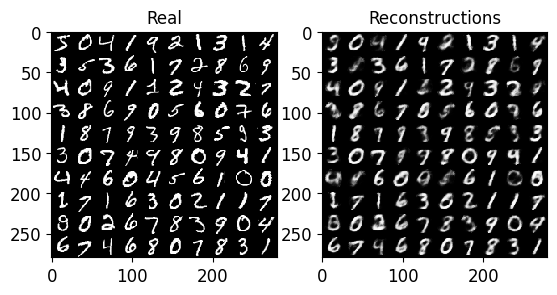

[iter: 801 ]: Training Loss: 0.10
[iter: 802 ]: Training Loss: 0.11
[iter: 803 ]: Training Loss: 0.10
[iter: 804 ]: Training Loss: 0.11
[iter: 805 ]: Training Loss: 0.12
[iter: 806 ]: Training Loss: 0.12
[iter: 807 ]: Training Loss: 0.11
[iter: 808 ]: Training Loss: 0.11
[iter: 809 ]: Training Loss: 0.10
[iter: 810 ]: Training Loss: 0.12
[iter: 811 ]: Training Loss: 0.11
[iter: 812 ]: Training Loss: 0.12
[iter: 813 ]: Training Loss: 0.10
[iter: 814 ]: Training Loss: 0.12
[iter: 815 ]: Training Loss: 0.11
[iter: 816 ]: Training Loss: 0.11
[iter: 817 ]: Training Loss: 0.11
[iter: 818 ]: Training Loss: 0.11
[iter: 819 ]: Training Loss: 0.12
[iter: 820 ]: Training Loss: 0.12
[iter: 821 ]: Training Loss: 0.12
[iter: 822 ]: Training Loss: 0.11
[iter: 823 ]: Training Loss: 0.09
[iter: 824 ]: Training Loss: 0.10
[iter: 825 ]: Training Loss: 0.10
[iter: 826 ]: Training Loss: 0.11
[iter: 827 ]: Training Loss: 0.12
[iter: 828 ]: Training Loss: 0.11
[iter: 829 ]: Training Loss: 0.13
[iter: 830 ]: 

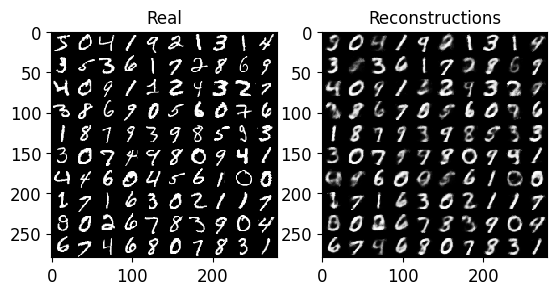

[iter: 851 ]: Training Loss: 0.12
[iter: 852 ]: Training Loss: 0.12
[iter: 853 ]: Training Loss: 0.12
[iter: 854 ]: Training Loss: 0.12
[iter: 855 ]: Training Loss: 0.09
[iter: 856 ]: Training Loss: 0.11
[iter: 857 ]: Training Loss: 0.11
[iter: 858 ]: Training Loss: 0.11
[iter: 859 ]: Training Loss: 0.11
[iter: 860 ]: Training Loss: 0.12
[iter: 861 ]: Training Loss: 0.12
[iter: 862 ]: Training Loss: 0.14
[iter: 863 ]: Training Loss: 0.12
[iter: 864 ]: Training Loss: 0.10
[iter: 865 ]: Training Loss: 0.12
[iter: 866 ]: Training Loss: 0.11
[iter: 867 ]: Training Loss: 0.11
[iter: 868 ]: Training Loss: 0.10
[iter: 869 ]: Training Loss: 0.11
[iter: 870 ]: Training Loss: 0.12
[iter: 871 ]: Training Loss: 0.10
[iter: 872 ]: Training Loss: 0.10
[iter: 873 ]: Training Loss: 0.11
[iter: 874 ]: Training Loss: 0.10
[iter: 875 ]: Training Loss: 0.10
[iter: 876 ]: Training Loss: 0.10
[iter: 877 ]: Training Loss: 0.11
[iter: 878 ]: Training Loss: 0.12
[iter: 879 ]: Training Loss: 0.12
[iter: 880 ]: 

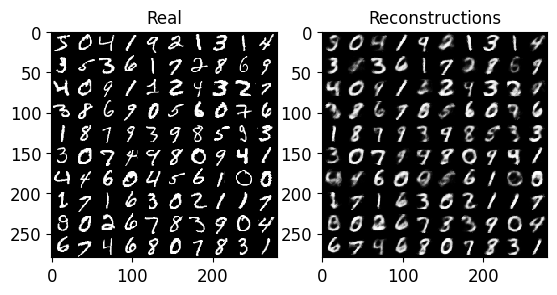

[iter: 901 ]: Training Loss: 0.10
[iter: 902 ]: Training Loss: 0.11
[iter: 903 ]: Training Loss: 0.11
[iter: 904 ]: Training Loss: 0.13
[iter: 905 ]: Training Loss: 0.12
[iter: 906 ]: Training Loss: 0.11
[iter: 907 ]: Training Loss: 0.10
[iter: 908 ]: Training Loss: 0.11
[iter: 909 ]: Training Loss: 0.10
[iter: 910 ]: Training Loss: 0.12
[iter: 911 ]: Training Loss: 0.11
[iter: 912 ]: Training Loss: 0.10
[iter: 913 ]: Training Loss: 0.12
[iter: 914 ]: Training Loss: 0.12
[iter: 915 ]: Training Loss: 0.11
[iter: 916 ]: Training Loss: 0.11
[iter: 917 ]: Training Loss: 0.09
[iter: 918 ]: Training Loss: 0.10
[iter: 919 ]: Training Loss: 0.10
[iter: 920 ]: Training Loss: 0.13
[iter: 921 ]: Training Loss: 0.11
[iter: 922 ]: Training Loss: 0.11
[iter: 923 ]: Training Loss: 0.11
[iter: 924 ]: Training Loss: 0.11
[iter: 925 ]: Training Loss: 0.11
[iter: 926 ]: Training Loss: 0.10
[iter: 927 ]: Training Loss: 0.11
[iter: 928 ]: Training Loss: 0.09
[iter: 929 ]: Training Loss: 0.11
[iter: 930 ]: 

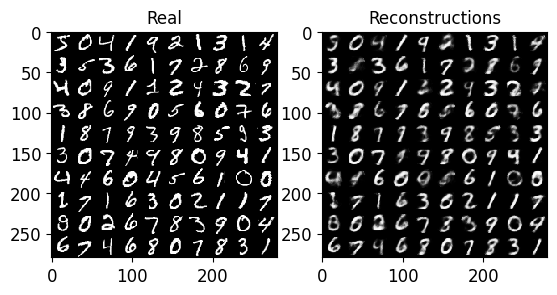

[iter: 951 ]: Training Loss: 0.11
[iter: 952 ]: Training Loss: 0.12
[iter: 953 ]: Training Loss: 0.10
[iter: 954 ]: Training Loss: 0.10
[iter: 955 ]: Training Loss: 0.12
[iter: 956 ]: Training Loss: 0.10
[iter: 957 ]: Training Loss: 0.13
[iter: 958 ]: Training Loss: 0.11
[iter: 959 ]: Training Loss: 0.10
[iter: 960 ]: Training Loss: 0.11
[iter: 961 ]: Training Loss: 0.11
[iter: 962 ]: Training Loss: 0.11
[iter: 963 ]: Training Loss: 0.12
[iter: 964 ]: Training Loss: 0.11
[iter: 965 ]: Training Loss: 0.11
[iter: 966 ]: Training Loss: 0.11
[iter: 967 ]: Training Loss: 0.10
[iter: 968 ]: Training Loss: 0.10
[iter: 969 ]: Training Loss: 0.11
[iter: 970 ]: Training Loss: 0.10
[iter: 971 ]: Training Loss: 0.12
[iter: 972 ]: Training Loss: 0.11
[iter: 973 ]: Training Loss: 0.10
[iter: 974 ]: Training Loss: 0.12
[iter: 975 ]: Training Loss: 0.12
[iter: 976 ]: Training Loss: 0.13
[iter: 977 ]: Training Loss: 0.11
[iter: 978 ]: Training Loss: 0.10
[iter: 979 ]: Training Loss: 0.10
[iter: 980 ]: 

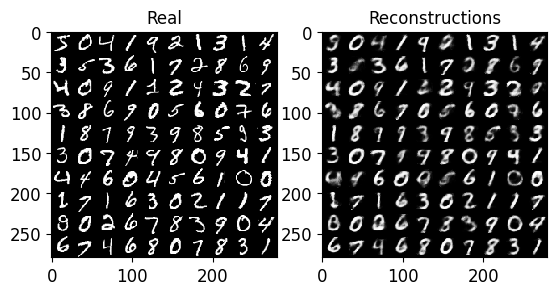

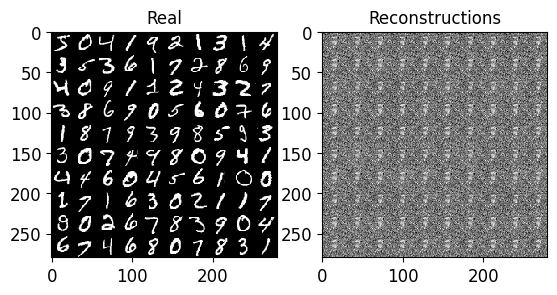

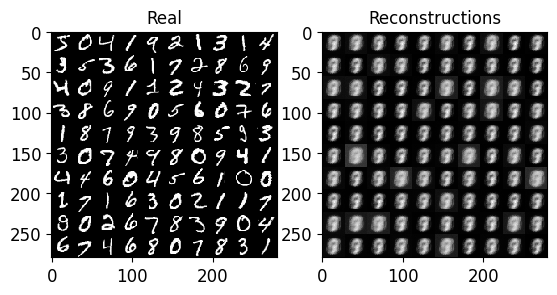

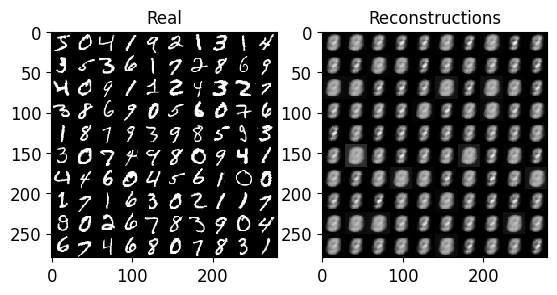

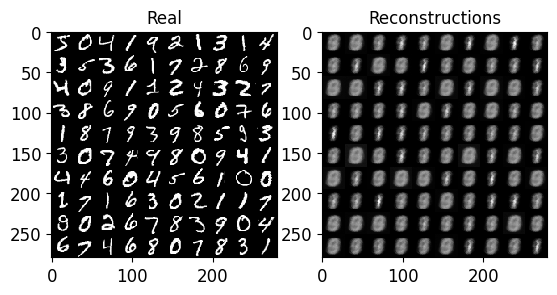

...

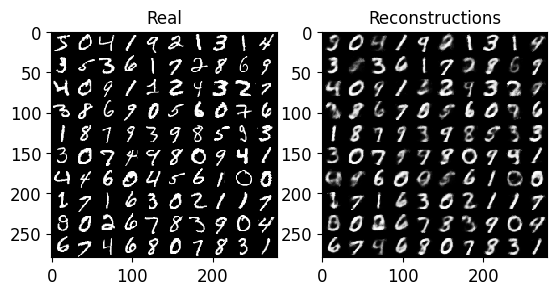

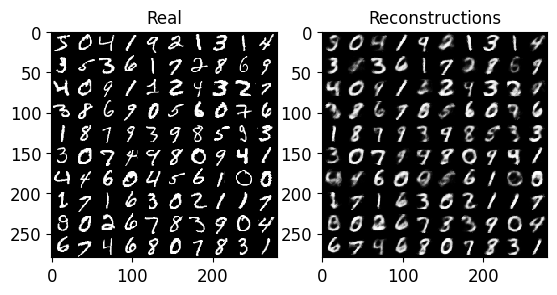

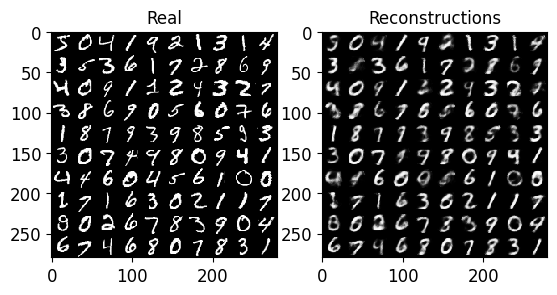

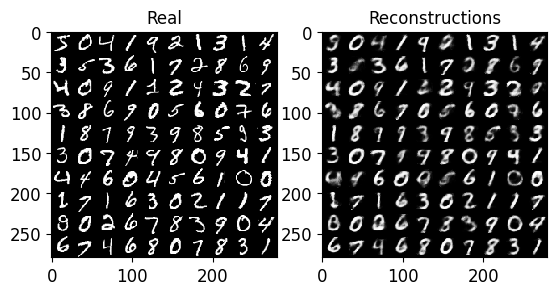

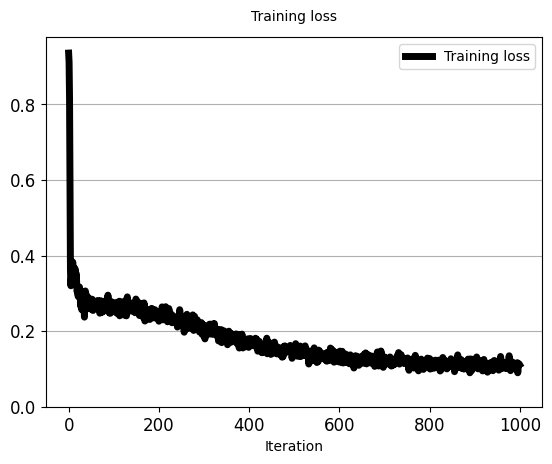

In [10]:
# The below is a copy paste from Task 2.
# ========== TODO: Use a bottleneck of 32 neurons and train it =================

# Create the network
rng = np.random.RandomState(seed=SEED)
autoencoder_wide = Autoencoder(rng=rng,
                               D_in=H_height*W_width,
                               D_hid_enc=256,
                               D_bottleneck=32,  # <--------- Width of Bottleneck
                               D_hid_dec=256)
# Start training
unsupervised_training_AE(autoencoder_wide,
                         reconstruction_loss,
                         rng,
                         train_imgs_flat,
                         batch_size=40,
                         learning_rate=3e-3,
                         total_iters=1000,
                         iters_per_recon_plot=50)

**Questions:**
- Compare the loss at the end of the training in comparison to the loss of the AE with bottleneck with 2 neurons. Is it higher or lower? Why?
- How do the reconstructed images compare with those from Task 2?

## Task 5: Is basic Auto-Encoder appropriate for synthesizing new data?

An Encoder of an AE learns a mapping from x (image space) to z (code).\
A Decoder of an AE learns a mapping from z (code) to x (image space).

We could try to use the Decoder of a pre-trained basic AE to try and synthesize non-existing data.\
How?\
We could sample a random code z, and decode it back to image space with the decoder.\
Will it work? Lets explore...

![title](./documentation/synthesize_data.png)

**We will create a new network, that is a Decoder-only network.**\
We will **NOT train** it.\
Instead, we will use the **pre-trained weights of the decoder of the AE from the previous Task 4**,\
to initialize the weights of this new Decoder.\
This is equivalent to taking the previous pre-trained AE, and throwing away its encoder part.\
We will then use this Decoder to **map randomly sampled codes z back to image space**, generating novel images.\
We will finally judge whether this approach is a solid approach to image synthesis (generation).

Lets go step by step... Lets first create the decoder...


In [11]:
class Decoder():
    def __init__(self, pretrained_ae):
        ############ TODO: Fill in the gaps. The aim is: ... ############
        # ... to use the weights of the pre-trained AE's DECODER,... ####
        # ... to initialize this Decoder.                            ####
        # Reminder: pretrained_ae.params[LAYER] contrains the params of the corresponding layer. See Task 2.
        w1 = torch.tensor(pretrained_ae.params[2], dtype=torch.float, requires_grad=False)
        w2 = torch.tensor(pretrained_ae.params[3], dtype=torch.float, requires_grad=False)
        self.params = [w1, w2]
        ###########################################################################
        
        
    def decode(self, z_batch):
        # Reconstruct a batch of images from a batch of z codes.
        # z_batch: Random codes. Numpy array of shape: [batch size, number of z dimensions]
        [w1, w2] = self.params
        
        z_batch_t = torch.tensor(z_batch, dtype=torch.float)  # Making a Pytorch tensor from Numpy array.
        # Adding an activation with value 1, for the bias. Similar to Task 2.
        unary_feature_for_bias = torch.ones(size=(z_batch_t.shape[0], 1)) # [N, 1] column vector.
        
        ##### TODO: Fill in the gaps, to REPLICATE the decoder of the AE from Task 4 #####
        # Hidden Layer of Decoder:
        z_batch_act_ext = torch.cat((z_batch_t, unary_feature_for_bias), dim=1)
        h1_preact = z_batch_act_ext.mm(w1)
        h1_act = h1_preact.clamp(min=0) # <--------------- RELU, like the AE's decoder
        # Output Layer:
        h1_ext = torch.cat((h1_act, unary_feature_for_bias), dim=1)
        h2_preact = h1_ext.mm(w2)
        h2_act = torch.tanh(h2_preact)
        ##################################################################################
        # Output
        x_pred = h2_act
        
        return x_pred
        
# Lets instantiate this Decoder, using the pre-trained AE with 32-dims ("wider") bottleneck:
net_decoder_pretrained = Decoder(autoencoder_wide)

C:\Users\Benwm\AppData\Local\Temp\ipykernel_33960\3867888076.py:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  w1 = torch.tensor(pretrained_ae.params[2], dtype=torch.float, requires_grad=False)
C:\Users\Benwm\AppData\Local\Temp\ipykernel_33960\3867888076.py:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  w2 = torch.tensor(pretrained_ae.params[3], dtype=torch.float, requires_grad=False)


If this were implemented correctly, there should be no output (except a "UserWarning" from pytorch perhaps).
If you see any other problem, then you may have done something wrong.

Assuming that the above did not return any issue (except perhaps a warning), lets continue...

We want to sample random Z and give it to the decoder, to synthesize a new image.

**But, from what range of values should we draw Z codes???**\
We have to find what range of values is covered by the embeddings when training the original AutoEncoder!!!\
We previously saw this for the AE with 2-dim Z. Now lets do it for the AE with 32-dim ...

In [12]:
# NOTE: This function was implemented in Task 3. We simply call it again, but for a different AE, the wider.

# Encode training samples, and get the min and max values of the z codes (for each dimension)
min_z_wider, max_z_wider = encode_and_get_min_max_z(autoencoder_wide,
                                                    train_imgs_flat,
                                                    train_lbls,
                                                    batch_size=100,
                                                    total_iterations=None,  # So that it runs over all data.
                                                    plot_2d_embedding=False)  # Code is 32-Dims. Cant plot in 2D
print("Min Z value per dimension:", min_z_wider)
print("Max Z value per dimension:", max_z_wider)

Min Z value per dimension: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]
Max Z value per dimension: [ 0.        0.       42.286503  0.       41.441685  0.        0.
  0.        0.        0.        0.        0.        0.        0.
  0.       49.99855  39.896553 37.461414  0.       39.914013  0.
 35.367657  0.       41.54573  36.36666   0.        0.       43.863304
  0.        0.        0.       38.31358 ]


**Questions:**

Compare min and max values per dimension. **What do you observe?** Dont be surprised if some dimensions of Z have "collapsed" and are just 0. Happens during training of neural networks that some neurons just "die"...

**Now lets use this range \[min,max\] of values, to finally try and synthesize some new images...**

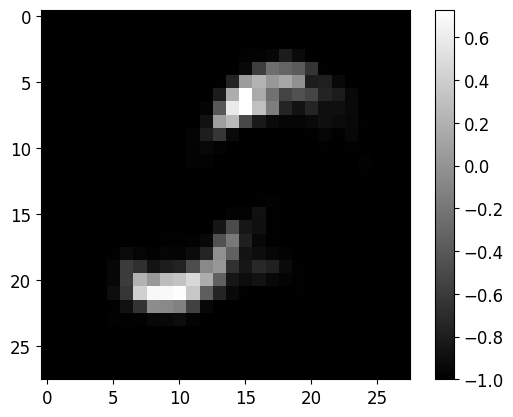

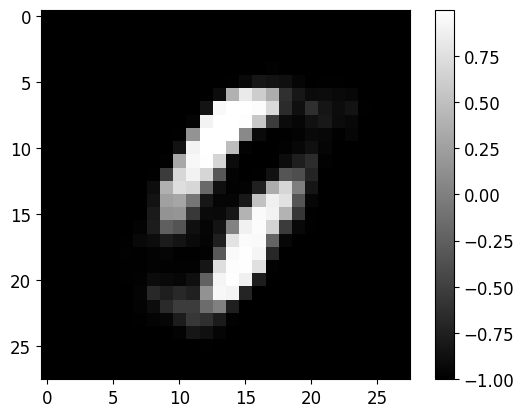

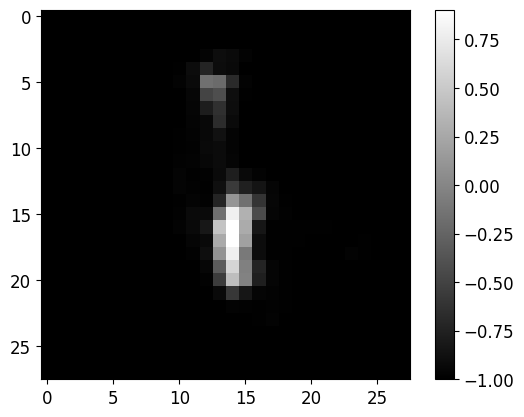

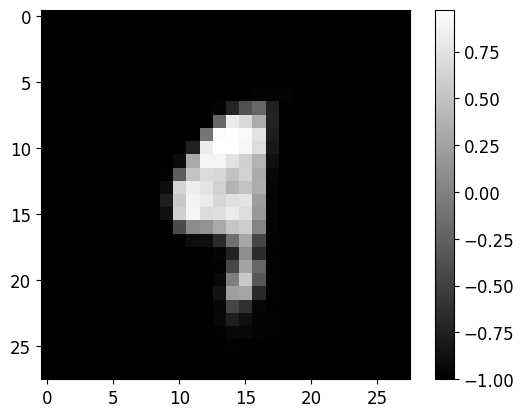

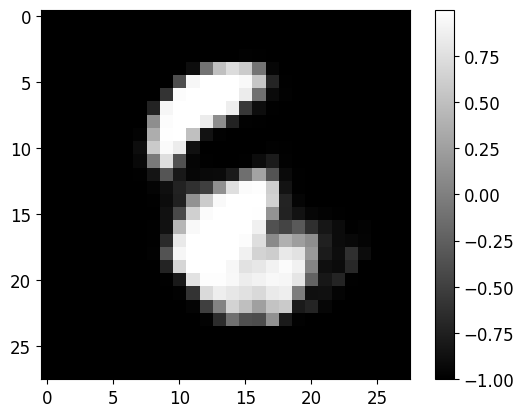

...

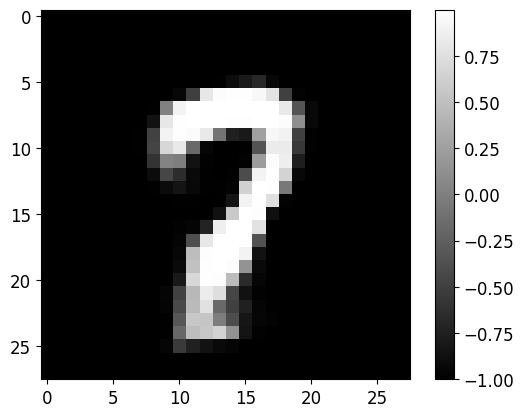

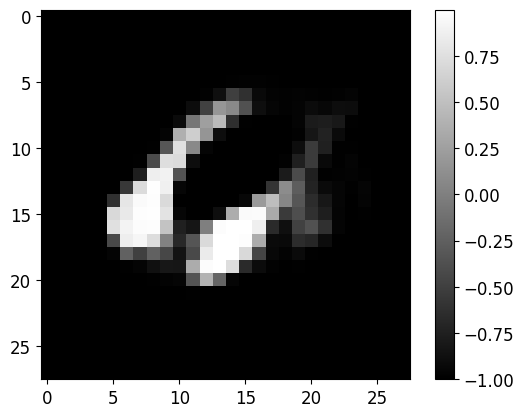

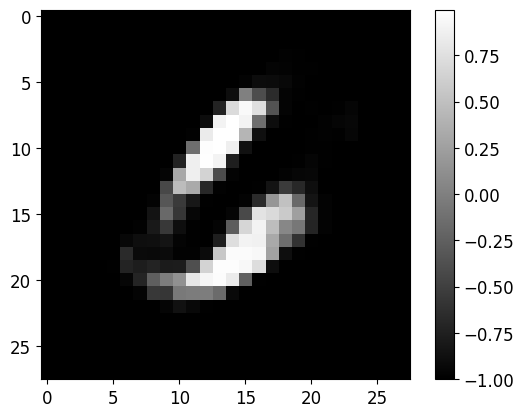

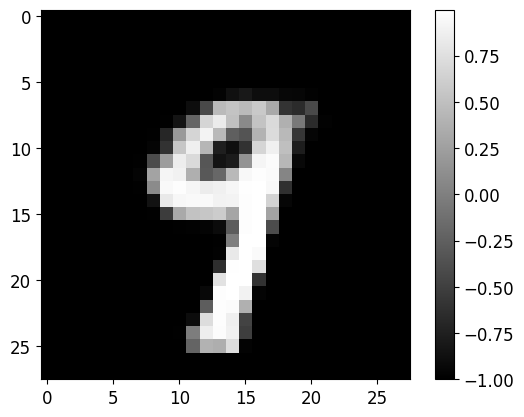

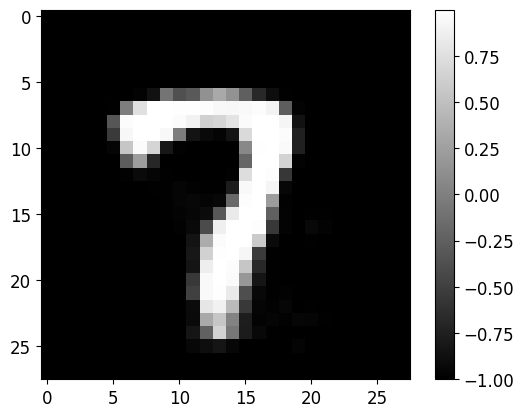

In [13]:
def synthesize(net_decoder,
               rng,
               z_min,
               z_max,
               n_samples):
    # net_decoder: Decoder with pre-trained weights.
    # z_min: numpy array (vector) of shape [dimensions-of-z]
    # z_max: numpy array (vector) of shape [dimensions-of-z]
    # n_samples: how many samples to produce.
    
    assert len(z_min.shape) == 1 and len(z_max.shape) == 1
    assert z_min.shape[0] == z_max.shape[0]
    
    z_dims = z_min.shape[0]  # Dimensionality of z codes (and input to decoder).
    
    # Create samples of z uniformly sampled from [z_min, z_max]
    z_samples = np.random.random_sample([n_samples, z_dims])  # Returns samples from uniform([0, 1))
    z_samples = z_samples * (z_max - z_min)  # Scales [0,1] range ==> [0,(max-min)] range
    z_samples = z_samples + z_min  # Puts the [0,(max-min)] range ==> [min, max] range
    
    x_samples = net_decoder.decode(z_samples)
    
    x_samples_np = x_samples if type(x_samples) is np.ndarray else x_samples.detach().numpy()  # torch to numpy
    
    for x_sample in x_samples_np:
        plot_image(x_sample.reshape([H_height, W_width]))
       
    
# Lets finally run the synthesis and see what happens...
rng = np.random.RandomState(seed=SEED)

synthesize(net_decoder_pretrained,
           rng,
           min_z_wider,  # From further above
           max_z_wider,  # From further above
           n_samples=20)

If everything was implemented correctly, you should see above images created by the decoder for the randomly sampled z-codes.

**Questions:**

- Observe the images. How many of them look realistic and good quality digits? Many? Half? Few?
- Are they comparable in quality with the reconstructions obtained for the actual training data at Task 4?
- If the quality of this synthesized data is not as good as you d expect from what you saw in Task 4, why do you think that is? Can you relate it with a characteristic of the plot of the embeddings in Task 3?

## Task 6: Learning from Unlabelled data with AE, to complement Supervised Classifier when Labelled data are limited: Lets first train a supervised Classifier 'from scratch'

We often want to train a **Classifier with labelled** data for a specific task. But labelled data are often **limited**, leading to sub-optimal performance of the Classifiers trained on them.

AEs learn useful representations from unlabelled data, which are easy to collect in large numbers. We would like to use the learned 'knowledge' (parameters) of an Unsupervised AE, to train even stronger Classifiers with limited labelled data.

How? We will see in the following 3 tasks.

First, we will create and train a fully-supervised MLP classifier only **on very limited (100) labelled data**.

The goal is to compare the performance of this classifier with what we achieve when complementing it with unlabelled data using an AutoEncoder (in later Task).

To make such a comparison "fair", **this fully-supervised MLP classifier will have exactly the same architecture as the encoder of the autoencoder_wide we built in Task 4, plus one additional classification layer**. This is exactly the **same as** in the task of pre-training the MLP classifier with using the AE weights.

![title](./documentation/classifier_scratch.png)

**The below code for creating a classifier, cross entropy loss, and training loop is complete.**\
Read it, and understand it, because we will use it for the next 2 tasks as well, to compare with performance achieved with classifier pre-trained with AE.

In [14]:
class Classifier_3layers(Network):
    def __init__(self, D_in, D_hid_1, D_hid_2, D_out, rng):
        D_in = D_in
        D_hid_1 = D_hid_1
        D_hid_2 = D_hid_2
        D_out = D_out
        
        # === NOTE: Notice that this is exactly the same architecture as encoder of AE in Task 4 ====
        w_1_init = rng.normal(loc=0.0, scale=0.01, size=(D_in+1, D_hid_1))
        w_2_init = rng.normal(loc=0.0, scale=0.01, size=(D_hid_1+1, D_hid_2))
        w_out_init = rng.normal(loc=0.0, scale=0.01, size=(D_hid_2+1, D_out))
        
        w_1 = torch.tensor(w_1_init, dtype=torch.float, requires_grad=True)
        w_2 = torch.tensor(w_2_init, dtype=torch.float, requires_grad=True)
        w_out = torch.tensor(w_out_init, dtype=torch.float, requires_grad=True)
        
        self.params = [w_1, w_2, w_out]
        
        
    def forward_pass(self, batch_inp):
        # compute predicted y
        [w_1, w_2, w_out] = self.params
        
        # In case input is image, make it a tensor.
        batch_imgs_t = torch.tensor(batch_inp, dtype=torch.float) if type(batch_inp) is np.ndarray else batch_inp
        
        unary_feature_for_bias = torch.ones(size=(batch_imgs_t.shape[0], 1)) # [N, 1] column vector.
        x = torch.cat((batch_imgs_t, unary_feature_for_bias), dim=1) # Extra feature=1 for bias.
        
        # === NOTE: This is the same architecture as encoder of AE in Task 4, with extra classification layer ===
        # Layer 1
        h1_preact = x.mm(w_1)
        h1_act = h1_preact.clamp(min=0)
        # Layer 2 (corresponds to bottleneck of the AE):
        h1_ext = torch.cat((h1_act, unary_feature_for_bias), dim=1)
        h2_preact = h1_ext.mm(w_2)
        h2_act = h2_preact.clamp(min=0)
        # Output classification layer
        h2_ext = torch.cat((h2_act, unary_feature_for_bias), dim=1)
        h_out = h2_ext.mm(w_out)
        
        logits = h_out
        
        # === Addition of a softmax function for 
        # Softmax activation function.
        exp_logits = torch.exp(logits)
        y_pred = exp_logits / torch.sum(exp_logits, dim=1, keepdim=True) 
        # sum with Keepdim=True returns [N,1] array. It would be [N] if keepdim=False.
        # Torch broadcasts [N,1] to [N,D_out] via repetition, to divide elementwise exp_h2 (which is [N,D_out]).
        
        return y_pred

    
def cross_entropy(y_pred, y_real, eps=1e-7):
    # y_pred: Predicted class-posterior probabilities, returned by forward_pass. Numpy array of shape [N, D_out]
    # y_real: One-hot representation of real training labels. Same shape as y_pred.
    
    # If number array is given, change it to a Torch tensor.
    y_pred = torch.tensor(y_pred, dtype=torch.float) if type(y_pred) is np.ndarray else y_pred
    y_real = torch.tensor(y_real, dtype=torch.float) if type(y_real) is np.ndarray else y_real
    
    x_entr_per_sample = - torch.sum( y_real*torch.log(y_pred+eps), dim=1)  # Sum over classes, axis=1
    
    loss = torch.mean(x_entr_per_sample, dim=0) # Expectation of loss: Mean over samples (axis=0).
    return loss



from utils.plotting import plot_train_progress_2

def train_classifier(classifier,
                     pretrained_AE,
                     loss_func,
                     rng,
                     train_imgs,
                     train_lbls,
                     test_imgs,
                     test_lbls,
                     batch_size,
                     learning_rate,
                     total_iters,
                     iters_per_test=-1):
    # Arguments:
    # classifier: A classifier network. It will be trained by this function using labelled data.
    #             Its input will be either original data (if pretrained_AE=0), ...
    #             ... or the output of the feature extractor if one is given.
    # pretrained_AE: A pretrained AutoEncoder that will *not* be trained here.
    #      It will be used to encode input data.
    #      The classifier will take as input the output of this feature extractor.
    #      If pretrained_AE = None: The classifier will simply receive the actual data as input.
    # train_imgs: Vectorized training images
    # train_lbls: One hot labels
    # test_imgs: Vectorized testing images, to compute generalization accuracy.
    # test_lbls: One hot labels for test data.
    # batch_size: batch size
    # learning_rate: come on...
    # total_iters: how many SGD iterations to perform.
    # iters_per_test: We will 'test' the model on test data every few iterations as specified by this.
    
    values_to_plot = {'loss':[], 'acc_train': [], 'acc_test': []}
    
    optimizer = optim.Adam(classifier.params, lr=learning_rate)
        
    for t in range(total_iters):
        # Sample batch for this SGD iteration
        train_imgs_batch, train_lbls_batch = get_random_batch(train_imgs, train_lbls, batch_size, rng)
        
        # Forward pass
        if pretrained_AE is None:
            inp_to_classifier = train_imgs_batch
        else:
            _, z_codes = pretrained_AE.forward_pass(train_imgs_batch)  # AE encodes. Output will be given to Classifier
            inp_to_classifier = z_codes
            
        y_pred = classifier.forward_pass(inp_to_classifier)
        
        # Compute loss:
        y_real = train_lbls_batch
        loss = loss_func(y_pred, y_real)  # Cross entropy
        
        # Backprop and updates.
        optimizer.zero_grad()
        grads = classifier.backward_pass(loss)
        optimizer.step()
        
        
        # ==== Report training loss and accuracy ======
        # y_pred and loss can be either np.array, or torch.tensor (see later). If tensor, make it np.array.
        y_pred_numpy = y_pred if type(y_pred) is np.ndarray else y_pred.detach().numpy()
        y_pred_lbls = np.argmax(y_pred_numpy, axis=1) # y_pred is soft/probability. Make it a hard one-hot label.
        y_real_lbls = np.argmax(y_real, axis=1)
        
        acc_train = np.mean(y_pred_lbls == y_real_lbls) * 100. # percentage
        
        loss_numpy = loss if type(loss) is type(float) else loss.item()
        print("[iter:", t, "]: Training Loss: {0:.2f}".format(loss), "\t Accuracy: {0:.2f}".format(acc_train))
        
        # =============== Every few iterations, show reconstructions ================#
        if t==total_iters-1 or t%iters_per_test == 0:
            if pretrained_AE is None:
                inp_to_classifier_test = test_imgs
            else:
                _, z_codes_test = pretrained_AE.forward_pass(test_imgs)
                inp_to_classifier_test = z_codes_test
                
            y_pred_test = classifier.forward_pass(inp_to_classifier_test)
            
            # ==== Report test accuracy ======
            y_pred_test_numpy = y_pred_test if type(y_pred_test) is np.ndarray else y_pred_test.detach().numpy()
            
            y_pred_lbls_test = np.argmax(y_pred_test_numpy, axis=1)
            y_real_lbls_test = np.argmax(test_lbls, axis=1)
            acc_test = np.mean(y_pred_lbls_test == y_real_lbls_test) * 100.
            print("\t\t\t\t\t\t\t\t Testing Accuracy: {0:.2f}".format(acc_test))
            
            # Keep list of metrics to plot progress.
            values_to_plot['loss'].append(loss_numpy)
            values_to_plot['acc_train'].append(acc_train)
            values_to_plot['acc_test'].append(acc_test)
                
    # In the end of the process, plot loss accuracy on training and testing data.
    plot_train_progress_2(values_to_plot['loss'], values_to_plot['acc_train'], values_to_plot['acc_test'], iters_per_test)
    

Now below, lets finally create an instance of this 3-layered classifier.

Fill in the number of neurons in the 2 hidden layers of the MLP Classifier, to be the same as the encoder of the AE (with the wide 32 bottleneck).

[iter: 0 ]: Training Loss: 2.30 	 Accuracy: 7.50
								 Testing Accuracy: 11.88
[iter: 1 ]: Training Loss: 2.31 	 Accuracy: 12.50
[iter: 2 ]: Training Loss: 2.30 	 Accuracy: 5.00
[iter: 3 ]: Training Loss: 2.31 	 Accuracy: 7.50
[iter: 4 ]: Training Loss: 2.29 	 Accuracy: 10.00
[iter: 5 ]: Training Loss: 2.28 	 Accuracy: 15.00
[iter: 6 ]: Training Loss: 2.29 	 Accuracy: 12.50
[iter: 7 ]: Training Loss: 2.30 	 Accuracy: 2.50
[iter: 8 ]: Training Loss: 2.25 	 Accuracy: 17.50
[iter: 9 ]: Training Loss: 2.23 	 Accuracy: 35.00
[iter: 10 ]: Training Loss: 2.17 	 Accuracy: 30.00
[iter: 11 ]: Training Loss: 2.23 	 Accuracy: 10.00
[iter: 12 ]: Training Loss: 2.20 	 Accuracy: 15.00
[iter: 13 ]: Training Loss: 2.22 	 Accuracy: 0.00
[iter: 14 ]: Training Loss: 2.14 	 Accuracy: 15.00
[iter: 15 ]: Training Loss: 2.10 	 Accuracy: 17.50
[iter: 16 ]: Training Loss: 1.93 	 Accuracy: 32.50
[iter: 17 ]: Training Loss: 2.04 	 Accuracy: 30.00
[iter: 18 ]: Training Loss: 1.91 	 Accuracy: 27.50
[iter: 19 ]: 

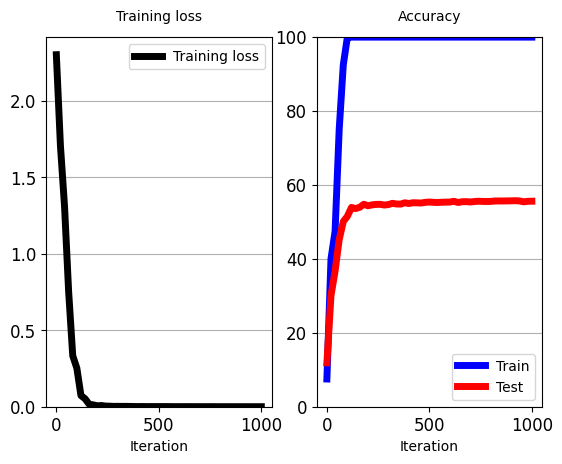

In [16]:
# Train Classifier from scratch (initialized randomly)

# Create the network
rng = np.random.RandomState(seed=SEED)
net_classifier_from_scratch = Classifier_3layers(D_in=H_height*W_width,
                                                 D_hid_1=256, # TODO: Use same as layer 1 of encoder of wide AE (Task 4)
                                                 D_hid_2=32,  # TODO: Use same as layer 2 of encoder of wide AE (Task 4)
                                                 D_out=C_classes,
                                                 rng=rng)
# Start training
train_classifier(net_classifier_from_scratch,
                 None,  # No pretrained AE
                 cross_entropy,
                 rng,
                 train_imgs_flat[:100],
                 train_lbls_onehot[:100],
                 test_imgs_flat,
                 test_lbls_onehot,
                 batch_size=40,
                 learning_rate=3e-3,
                 total_iters=1000,
                 iters_per_test=20)


If everything went as expected, you should see the training loss of the classifier going down, reaching (close to) 0. At the end, you will find a plot of the loss curve, the training accuracy (approx 100%), and the testing accuracy (approx 57%).

**Questions**:

- How do you explain the "generalization gap" between training and testing accuracy?
- How do you think the amount of labelled data (above =100 by default) affect this gap? Feel free to experiment with other amounts of labelled data.


## Task 7: Use Unsupervised AE as 'pre-trained feature-extractor' for a supervised Classifier when labels are limited

There are 2 methods that a pre-trained AE can be used to help training better Classifiers when labelled data are limited.

Approach-1: We take the encoder of the pre-trained AE (already trained with unlabelled data) and place an untrained, small (often 1 layer) Classifier on top. The Classifier receives as input the output of the encoder, i.e. the codes z of data x. We then use the limited labelled data for training. Importantly, we only train the small Classifier. The encoder is used as 'frozen' (does not get trained further) feature extractor. This method allows training with limited labelled data because we only train the small Classifier (the encoder is frozen), therefore we are less likely to overfit in theory. See next figure for a visual explanation.

![title](./documentation/encoder_frozen.png)

Approach-2 will be explored in the next and final task.

Complete and run the code below.


[iter: 0 ]: Training Loss: 2.42 	 Accuracy: 0.00
								 Testing Accuracy: 10.79
[iter: 1 ]: Training Loss: 2.25 	 Accuracy: 12.50
[iter: 2 ]: Training Loss: 2.08 	 Accuracy: 20.00
[iter: 3 ]: Training Loss: 2.16 	 Accuracy: 7.50
[iter: 4 ]: Training Loss: 1.99 	 Accuracy: 35.00
[iter: 5 ]: Training Loss: 1.78 	 Accuracy: 60.00
[iter: 6 ]: Training Loss: 1.90 	 Accuracy: 32.50
[iter: 7 ]: Training Loss: 1.79 	 Accuracy: 47.50
[iter: 8 ]: Training Loss: 1.74 	 Accuracy: 45.00
[iter: 9 ]: Training Loss: 1.67 	 Accuracy: 50.00
[iter: 10 ]: Training Loss: 1.57 	 Accuracy: 62.50
[iter: 11 ]: Training Loss: 1.51 	 Accuracy: 67.50
[iter: 12 ]: Training Loss: 1.37 	 Accuracy: 72.50
[iter: 13 ]: Training Loss: 1.43 	 Accuracy: 77.50
[iter: 14 ]: Training Loss: 1.37 	 Accuracy: 65.00
[iter: 15 ]: Training Loss: 1.33 	 Accuracy: 60.00
[iter: 16 ]: Training Loss: 1.44 	 Accuracy: 65.00
[iter: 17 ]: Training Loss: 1.41 	 Accuracy: 72.50
[iter: 18 ]: Training Loss: 1.39 	 Accuracy: 70.00
[iter: 19 

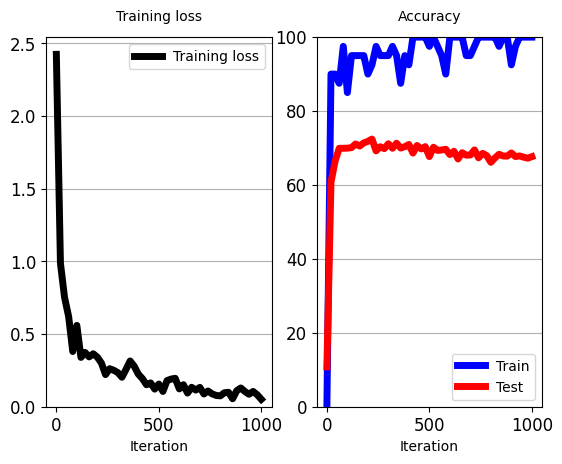

In [17]:
# Train classifier on top of pre-trained AE encoder

class Classifier_1layer(Network):
    # Classifier with just 1 layer, the classification layer
    def __init__(self, D_in, D_out, rng):
        # D_in: dimensions of input
        # D_out: dimension of output (number of classes)
        
        #### TODO: Fill in the blanks ######################
        w_out_init = rng.normal(loc=0.0, scale=0.01, size=(D_in+1, D_out))
        w_out = torch.tensor(w_out_init, dtype=torch.float, requires_grad=True)
        ####################################################
        self.params = [w_out]
        
        
    def forward_pass(self, batch_inp):
        # compute predicted y
        [w_out] = self.params
        
        # In case input is image, make it a tensor.
        batch_inp_t = torch.tensor(batch_inp, dtype=torch.float) if type(batch_inp) is np.ndarray else batch_inp
        
        unary_feature_for_bias = torch.ones(size=(batch_inp_t.shape[0], 1)) # [N, 1] column vector.
        batch_inp_ext = torch.cat((batch_inp_t, unary_feature_for_bias), dim=1) # Extra feature=1 for bias.
        
        # Output classification layer
        logits = batch_inp_ext.mm(w_out)
        
        # Output layer activation function
        # Softmax activation function.
        exp_logits = torch.exp(logits)
        y_pred = exp_logits / torch.sum(exp_logits, dim=1, keepdim=True) 
        # sum with Keepdim=True returns [N,1] array. It would be [N] if keepdim=False.
        # Torch broadcasts [N,1] to [N,D_out] via repetition, to divide elementwise exp_h2 (which is [N,D_out]).
        
        return y_pred
    
    
    
# Create the network
rng = np.random.RandomState(seed=SEED) # Random number generator
# As input, it will be getting z-codes from the AE with 32-neurons bottleneck from Task 4.
classifier_1layer = Classifier_1layer(autoencoder_wide.D_bottleneck,  # Input dimension is dimensions of AE's Z
                                      C_classes,
                                      rng=rng)

########### TODO: Fill in the gaps to start training ####################
# Give to the function the 1-layer classifier, as well as the pre-trained AE that will work as feature extractor.
# For the pre-trained AE, give the instance of 'wide' AE that has 32-neurons bottleneck, which you trained in Task 4.
train_classifier(classifier_1layer,
                 autoencoder_wide,  # Pretrained AE, to use as feature extractor.
                 cross_entropy,
                 rng,
                 train_imgs_flat[:100],
                 train_lbls_onehot[:100],
                 test_imgs_flat,
                 test_lbls_onehot,
                 batch_size=40,
                 learning_rate=3e-3,   # 5e-3, is the best for 1-layer classifier and all data.
                 total_iters=1000,
                 iters_per_test=20)

If you completed the task appropriately, you shoudl see the model getting trained and performance reported at the bottom. Training accuracy should approach 100% and test accuracy should be approximately 65%

**Questions:**
- Compare with test accuracy from Task 7. How do the 2 differ? How would you justify the difference?
- Try the same experiments (Task 6 and Task 7) using different amounts of labelled data. What do you observe as the number of training data increases?

## Task 8: Use parameters of an Unsupervised AE's encoder to initialize weights of a supervised Classifier, followed by refinement using limited labels

Approach-2: The second approach is to build a Classifier that has the same architecture as the encoder of an AutoEncoder, followed by an extra classification layer. We first train the Autoencoder on unlabelled data (as done in Task 4). Then, we **use the pre-trained weights of the AE's encoder to initialize the corresponding parameters of the Classifier**. The classification layer of the Classifier is initialized randomly. Then, **with the limited labelled data, we refine (train) all the parameters of the classifier**. The advantage of this approach is that the Classifier begins with the "knowledge" (parameters) extracted from unlabelled data, and then all of it is refined with extra "knowledge" from the labelled data. See figure below for visual explanation.

![title](./documentation/refinement.png)

**The code below is complete.**\
Read it, understand it, run it, and try to answer the questions below.

C:\Users\Benwm\AppData\Local\Temp\ipykernel_33960\3309531353.py:19: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  w_1 = torch.tensor(pretrained_AE.params[0], dtype=torch.float, requires_grad=True)
C:\Users\Benwm\AppData\Local\Temp\ipykernel_33960\3309531353.py:20: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  w_2 = torch.tensor(pretrained_AE.params[1], dtype=torch.float, requires_grad=True)


[iter: 0 ]: Training Loss: 2.42 	 Accuracy: 0.00
								 Testing Accuracy: 12.06
[iter: 1 ]: Training Loss: 2.19 	 Accuracy: 12.50
[iter: 2 ]: Training Loss: 2.04 	 Accuracy: 22.50
[iter: 3 ]: Training Loss: 2.11 	 Accuracy: 15.00
[iter: 4 ]: Training Loss: 1.89 	 Accuracy: 50.00
[iter: 5 ]: Training Loss: 1.68 	 Accuracy: 67.50
[iter: 6 ]: Training Loss: 1.71 	 Accuracy: 42.50
[iter: 7 ]: Training Loss: 1.58 	 Accuracy: 57.50
[iter: 8 ]: Training Loss: 1.55 	 Accuracy: 60.00
[iter: 9 ]: Training Loss: 1.36 	 Accuracy: 65.00
[iter: 10 ]: Training Loss: 1.18 	 Accuracy: 65.00
[iter: 11 ]: Training Loss: 1.12 	 Accuracy: 67.50
[iter: 12 ]: Training Loss: 0.88 	 Accuracy: 70.00
[iter: 13 ]: Training Loss: 0.98 	 Accuracy: 62.50
[iter: 14 ]: Training Loss: 0.86 	 Accuracy: 75.00
[iter: 15 ]: Training Loss: 0.72 	 Accuracy: 80.00
[iter: 16 ]: Training Loss: 0.93 	 Accuracy: 77.50
[iter: 17 ]: Training Loss: 0.84 	 Accuracy: 82.50
[iter: 18 ]: Training Loss: 0.78 	 Accuracy: 80.00
[iter: 19

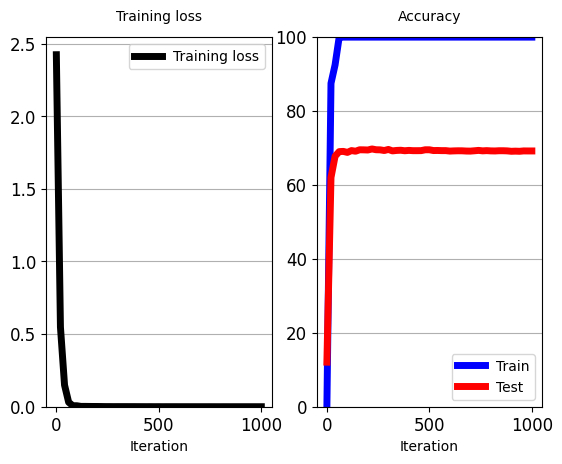

In [18]:
# Pre-train a classifier.

# The below classifier has THE SAME architecture as the 3-layer Classifier that we trained...
# ... in a purely supervised manner in Task-6.
# This is done by inheriting the class (Classifier_3layers), therefore uses THE SAME forward_pass() function.
# THE ONLY DIFFERENCE is in the construction __init__.
# This 'pretrained' classifier receives as input a pretrained autoencoder (pretrained_AE) from Task 4.
# It then uses the parameters of the AE's encoder to initialize its own parameters, rather than random initialization.
# The model is then trained all together.
class Classifier_3layers_pretrained(Classifier_3layers):
    def __init__(self, pretrained_AE, D_in, D_out, rng):
        D_in = D_in
        D_hid_1 = 256
        D_hid_2 = 32
        D_out = D_out

        w_out_init = rng.normal(loc=0.0, scale=0.01, size=(D_hid_2+1, D_out))
        
        w_1 = torch.tensor(pretrained_AE.params[0], dtype=torch.float, requires_grad=True)
        w_2 = torch.tensor(pretrained_AE.params[1], dtype=torch.float, requires_grad=True)
        w_out = torch.tensor(w_out_init, dtype=torch.float, requires_grad=True)
        
        self.params = [w_1, w_2, w_out]
        
# Create the network
rng = np.random.RandomState(seed=SEED) # Random number generator
classifier_3layers_pretrained = Classifier_3layers_pretrained(autoencoder_wide,  # The AE pre-trained in Task 4.
                                                              train_imgs_flat.shape[1],
                                                              C_classes,
                                                              rng=rng)

# Start training
# NOTE: Only the 3-layer pretrained classifier is used, and will be trained all together.
# No frozen feature extractor.
train_classifier(classifier_3layers_pretrained,  # classifier that will be trained.
                 None,  # No pretrained AE to act as 'frozen' feature extractor.
                 cross_entropy,
                 rng,
                 train_imgs_flat[:100],
                 train_lbls_onehot[:100],
                 test_imgs_flat,
                 test_lbls_onehot,
                 batch_size=40,
                 learning_rate=3e-3,
                 total_iters=1000,
                 iters_per_test=20)

**Questions:**

- How does generalization performance of this Classifier, pretrained via AE, and where all its parameters are refined with the limited labelled data, compares with the same classifier trained ONLY with labelled data (Task 6)?
- How does it compare with the approach in Task 7? Is the generalization better or worse? Why?
- How do you think this approach (Task 8) compares with previous approach (Task 7) when more or less labelled data are used? What is the advantage and disadvantage of this approach that can influence whether its better or worse when we use more or less labelled data?
- Feel free to repeat Tasks 6,7,8 for different amounts of labelled data to investigate.

**Note:** By default, the code of Tasks 6,7,8 above trains the model using only 100 out of the 60000 labelled training data. Feel free to repeat Tasks 6,7,8 for different amounts of labelled data, compare performance behaviour. This may help you answer the question above.


## This notebook:
Copyright 2021, University of Birmingham  
Tutorial for Neural Computation  
For issues e-mail: k.kamnitsas@bham.ac.uk